In [55]:
import os
import random
import pandas as pd

from ta.momentum import RSIIndicator, StochasticOscillator, UltimateOscillator, ROCIndicator, WilliamsRIndicator
from ta.trend import CCIIndicator, ADXIndicator, MACD, IchimokuIndicator
from ta.volume import VolumeWeightedAveragePrice

import plotly.graph_objects as go
import matplotlib.pyplot as plt
import mplfinance as mpf
import seaborn as sns

In [2]:
data_dir = 'D:/Ujjval/AI-ML/ML/Stock Price Prediction/data till 2023-1/'
csv_files = [f for f in os.listdir(data_dir) if f.endswith(".csv")]

In [3]:
combined_df = pd.DataFrame()
for file in csv_files:
    file_path = os.path.join(data_dir, file)
    df = pd.read_csv(file_path)
    combined_df = pd.concat([combined_df, df])

In [4]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5642483 entries, 0 to 3502
Data columns (total 9 columns):
 #   Column               Dtype  
---  ------               -----  
 0   datetime             object 
 1   symbol               object 
 2   open                 float64
 3   high                 float64
 4   low                  float64
 5   close                float64
 6   volume               float64
 7   change (%)           float64
 8   last day change (%)  float64
dtypes: float64(7), object(2)
memory usage: 430.5+ MB


In [5]:
combined_df['datetime'] = pd.to_datetime(combined_df['datetime'])
combined_df['datetime'] = combined_df['datetime'].dt.date
combined_df.sort_values(['symbol', 'datetime'], inplace=True)
combined_df = combined_df.reset_index(drop=True)

In [6]:
combined_df['datetime'] = pd.to_datetime(combined_df['datetime'])

In [7]:
combined_df.isnull().sum()

datetime                  0
symbol                    0
open                      0
high                      0
low                       0
close                     0
volume                    0
change (%)             4887
last day change (%)    6845
dtype: int64

In [8]:
combined_df['change (%)'].fillna(0.00, inplace=True)
combined_df['last day change (%)'].fillna(0.00, inplace=True)

In [9]:
combined_df

,datetime,symbol,open,high,low,close,volume,change (%),last day change (%)
0,2008-10-06,NSE:20MICRONS,40.000000,40.000000,15.800000,16.825001,23501730.0,-57.937497,0.000000
1,2008-10-07,NSE:20MICRONS,16.000000,19.000000,13.925000,15.050000,9113422.0,-5.937500,-57.937497
2,2008-10-08,NSE:20MICRONS,14.000000,14.600001,12.550000,13.250000,2464384.0,-5.357143,-5.937500
3,2008-10-10,NSE:20MICRONS,12.450000,12.450000,10.825000,11.600001,1207928.0,-6.827305,-5.357143
4,2008-10-13,NSE:20MICRONS,12.149999,13.300000,11.649999,12.325000,898692.0,1.440333,-6.827305
...,...,...,...,...,...,...,...,...,...
5642478,2024-01-04,NSE:ZYDUSWELL,1695.000000,1698.000000,1666.250000,1686.350000,38748.0,-0.510324,0.947004
5642479,2024-01-05,NSE:ZYDUSWELL,1681.050000,1698.000000,1675.550000,1691.450000,32536.0,0.618661,-0.510324
5642480,2024-01-08,NSE:ZYDUSWELL,1699.000000,1721.000000,1673.800000,1680.850000,52258.0,-1.068275,0.618661
5642481,2024-01-09,NSE:ZYDUSWELL,1680.850000,1688.950000,1640.500000,1649.300000,26871.0,-1.877027,-1.068275


In [10]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5642483 entries, 0 to 5642482
Data columns (total 9 columns):
 #   Column               Dtype         
---  ------               -----         
 0   datetime             datetime64[ns]
 1   symbol               object        
 2   open                 float64       
 3   high                 float64       
 4   low                  float64       
 5   close                float64       
 6   volume               float64       
 7   change (%)           float64       
 8   last day change (%)  float64       
dtypes: datetime64[ns](1), float64(7), object(1)
memory usage: 387.4+ MB


In [11]:
combined_df.duplicated().sum()

0

In [12]:
# Add Relative Strength Index (14)
combined_df['rsi_14'] = RSIIndicator(combined_df['close'], window=14).rsi()

In [13]:
# Add Stochastic %K (14, 3, 3)
combined_df['stoch_oscillator'] = StochasticOscillator(
    combined_df['high'], combined_df['low'], combined_df['close'], window=14, smooth_window=3).stoch()

In [14]:
# Add Commodity Channel Index (20)
combined_df['cci'] = CCIIndicator(combined_df['high'], combined_df['low'], combined_df['close'], window=20).cci()

In [15]:
# Add Average Directional Index (14)
combined_df['adx'] = ADXIndicator(combined_df['high'], combined_df['low'], combined_df['close'], window=14).adx()

In [16]:
# Add Awesome Oscillator
combined_df['awesome_oscillator'] = ROCIndicator(combined_df['close'], window=5).roc()

In [17]:
# Add Momentum (10)
combined_df['momentum'] = ROCIndicator(combined_df['close'], window=10).roc()

In [18]:
# Add MACD Level (12, 26)
macd = MACD(combined_df['close'], window_slow=26, window_fast=12, window_sign=9)
combined_df['macd'] = macd.macd()
combined_df['macd_signal'] = macd.macd_signal()
combined_df['macd_diff'] = macd.macd_diff()

In [19]:
# Add Stochastic RSI Fast (3, 3, 14, 14)
combined_df['stoch_rsi_fast'] = StochasticOscillator(
    combined_df['rsi_14'], combined_df['rsi_14'], combined_df['rsi_14'], window=3, smooth_window=3).stoch()

In [20]:
# Add Williams Percent Range (14)
combined_df['williams_r'] = WilliamsRIndicator(combined_df['high'], combined_df['low'], combined_df['close'], lbp=14).williams_r()

In [21]:
# Add Bull Bear Power
combined_df['bull_bear_power'] = combined_df['high'] - combined_df['low']

In [22]:
# Add Ultimate Oscillator (7, 14, 28)
combined_df['ultimate_oscillator'] = UltimateOscillator(
    combined_df['high'], combined_df['low'], combined_df['close'], window1=7, window2=14, window3=28).ultimate_oscillator()

In [23]:
# Add Exponential Moving Averages
combined_df['ema_10'] = combined_df['close'].ewm(span=10, adjust=False).mean()
combined_df['ema_20'] = combined_df['close'].ewm(span=20, adjust=False).mean()
combined_df['ema_30'] = combined_df['close'].ewm(span=30, adjust=False).mean()
combined_df['ema_50'] = combined_df['close'].ewm(span=50, adjust=False).mean()
combined_df['ema_100'] = combined_df['close'].ewm(span=100, adjust=False).mean()
combined_df['ema_200'] = combined_df['close'].ewm(span=200, adjust=False).mean()

In [24]:
# Add Simple Moving Averages
combined_df['sma_10'] = combined_df['close'].rolling(window=10).mean()
combined_df['sma_20'] = combined_df['close'].rolling(window=20).mean()
combined_df['sma_30'] = combined_df['close'].rolling(window=30).mean()
combined_df['sma_50'] = combined_df['close'].rolling(window=50).mean()
combined_df['sma_100'] = combined_df['close'].rolling(window=100).mean()
combined_df['sma_200'] = combined_df['close'].rolling(window=200).mean()

In [25]:
# Add Ichimoku Base Line (9, 26, 52, 26)
combined_df['ichimoku_base_line'] = IchimokuIndicator(combined_df['high'], combined_df['low'], window1=9, window2=26, window3=52).ichimoku_base_line()

In [26]:
# Add Volume Weighted Moving Average (20)
combined_df['vwma_20'] = VolumeWeightedAveragePrice(combined_df['high'], combined_df['low'],combined_df['close'], combined_df['volume'], window=20).volume_weighted_average_price()

In [27]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5642483 entries, 0 to 5642482
Data columns (total 36 columns):
 #   Column               Dtype         
---  ------               -----         
 0   datetime             datetime64[ns]
 1   symbol               object        
 2   open                 float64       
 3   high                 float64       
 4   low                  float64       
 5   close                float64       
 6   volume               float64       
 7   change (%)           float64       
 8   last day change (%)  float64       
 9   rsi_14               float64       
 10  stoch_oscillator     float64       
 11  cci                  float64       
 12  adx                  float64       
 13  awesome_oscillator   float64       
 14  momentum             float64       
 15  macd                 float64       
 16  macd_signal          float64       
 17  macd_diff            float64       
 18  stoch_rsi_fast       float64       
 19  williams_r           

In [28]:
combined_df.isnull().sum()

datetime                   0
symbol                     0
open                       0
high                       0
low                        0
close                      0
volume                     0
change (%)                 0
last day change (%)        0
rsi_14                    13
stoch_oscillator        1439
cci                      404
adx                        0
awesome_oscillator         5
momentum                  10
macd                      25
macd_signal               33
macd_diff                 33
stoch_rsi_fast         24424
williams_r              1439
bull_bear_power            0
ultimate_oscillator     2336
ema_10                     0
ema_20                     0
ema_30                     0
ema_50                     0
ema_100                    0
ema_200                    0
sma_10                     9
sma_20                    19
sma_30                    29
sma_50                    49
sma_100                   99
sma_200                  199
ichimoku_base_

In [29]:
combined_df.fillna(0.000, inplace=True)

In [30]:
combined_df.isnull().sum()

datetime               0
symbol                 0
open                   0
high                   0
low                    0
close                  0
volume                 0
change (%)             0
last day change (%)    0
rsi_14                 0
stoch_oscillator       0
cci                    0
adx                    0
awesome_oscillator     0
momentum               0
macd                   0
macd_signal            0
macd_diff              0
stoch_rsi_fast         0
williams_r             0
bull_bear_power        0
ultimate_oscillator    0
ema_10                 0
ema_20                 0
ema_30                 0
ema_50                 0
ema_100                0
ema_200                0
sma_10                 0
sma_20                 0
sma_30                 0
sma_50                 0
sma_100                0
sma_200                0
ichimoku_base_line     0
vwma_20                0
dtype: int64

In [31]:
random_symbols = random.sample(combined_df['symbol'].unique().tolist(), 5)
filtered_data = pd.concat([combined_df[(combined_df['symbol'] == symbol)].tail(250) for symbol in random_symbols])

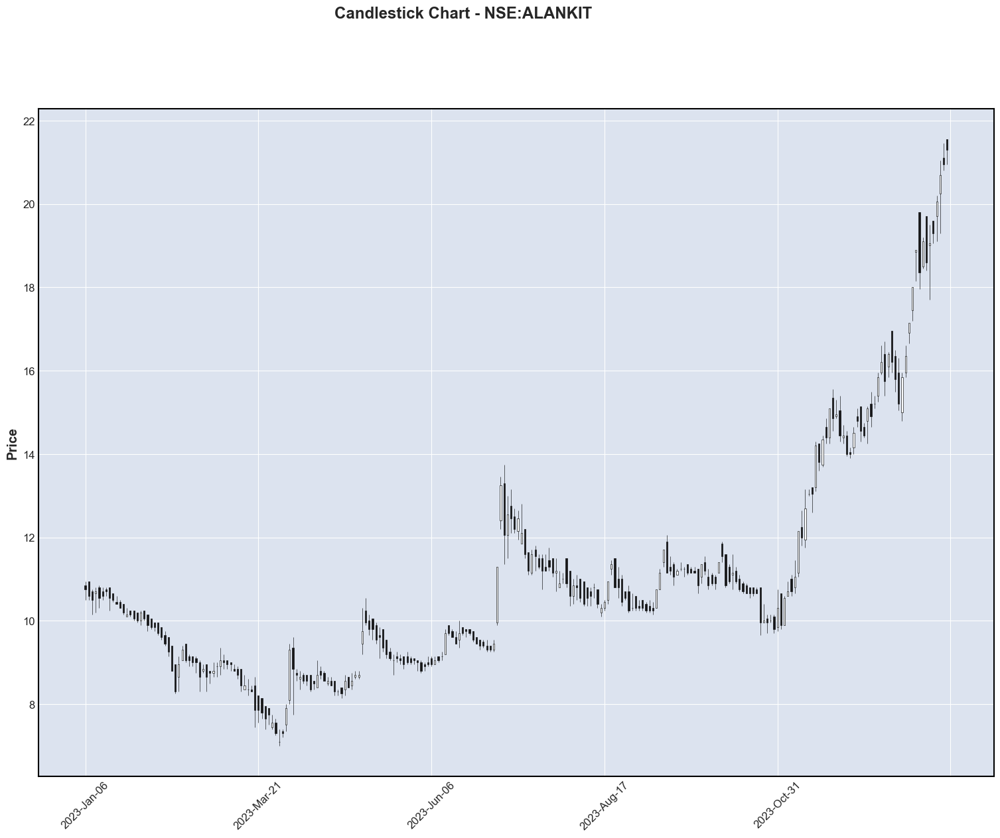

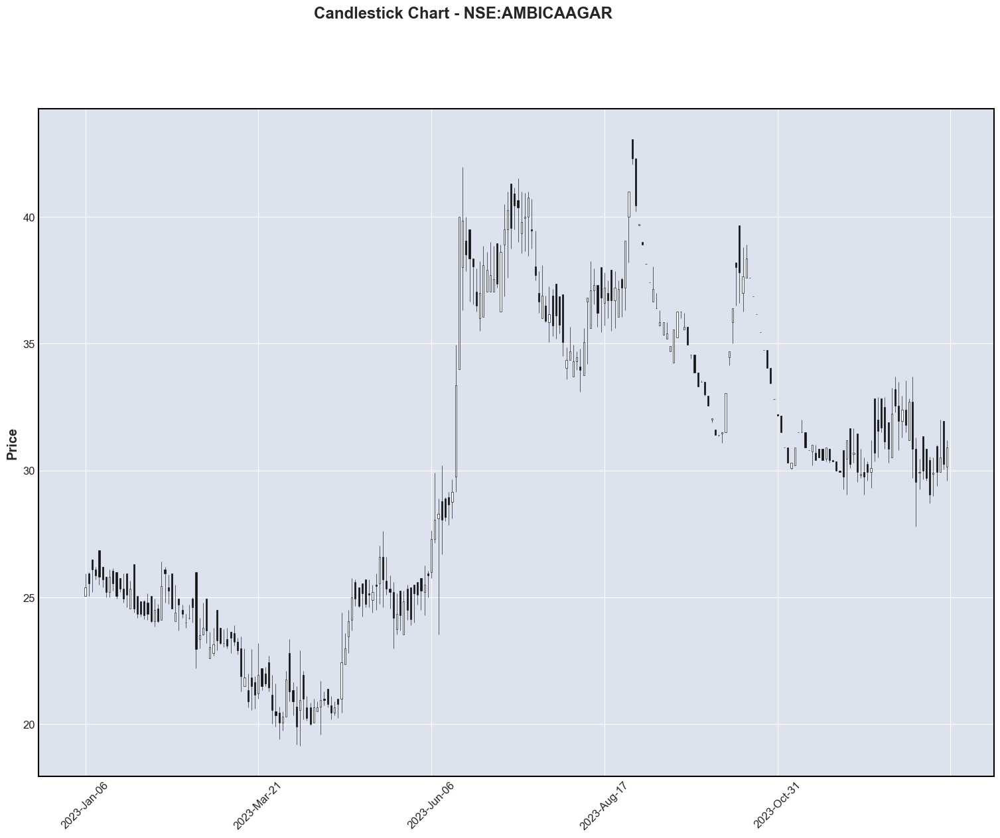

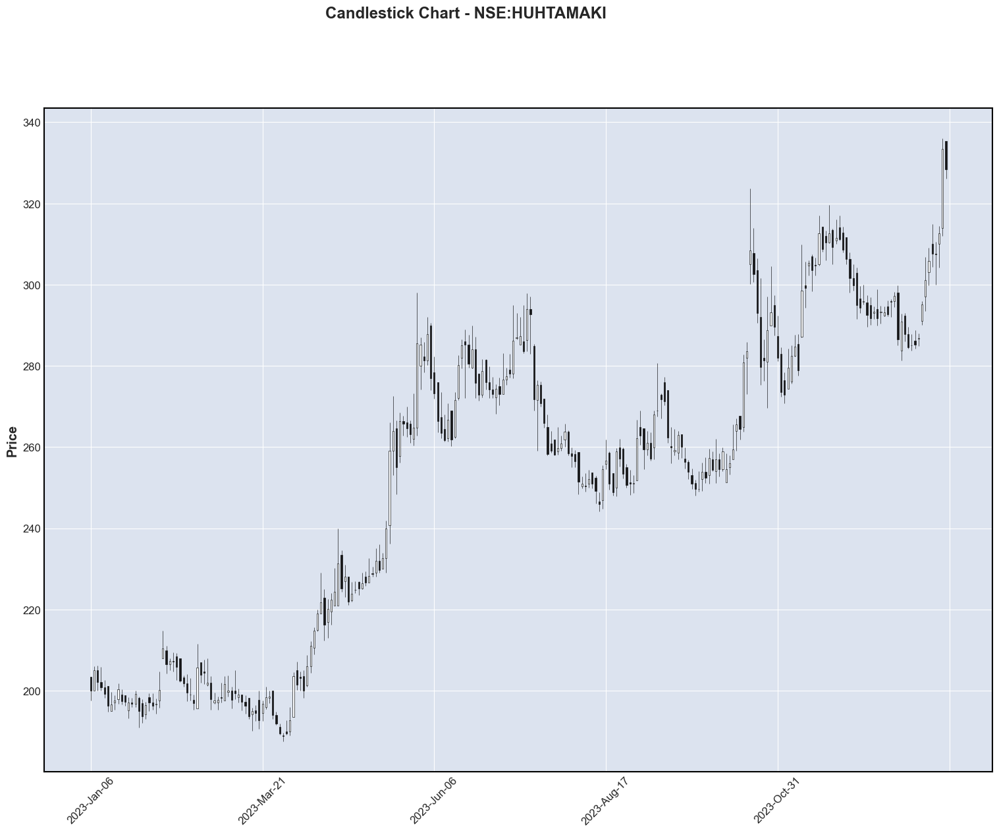

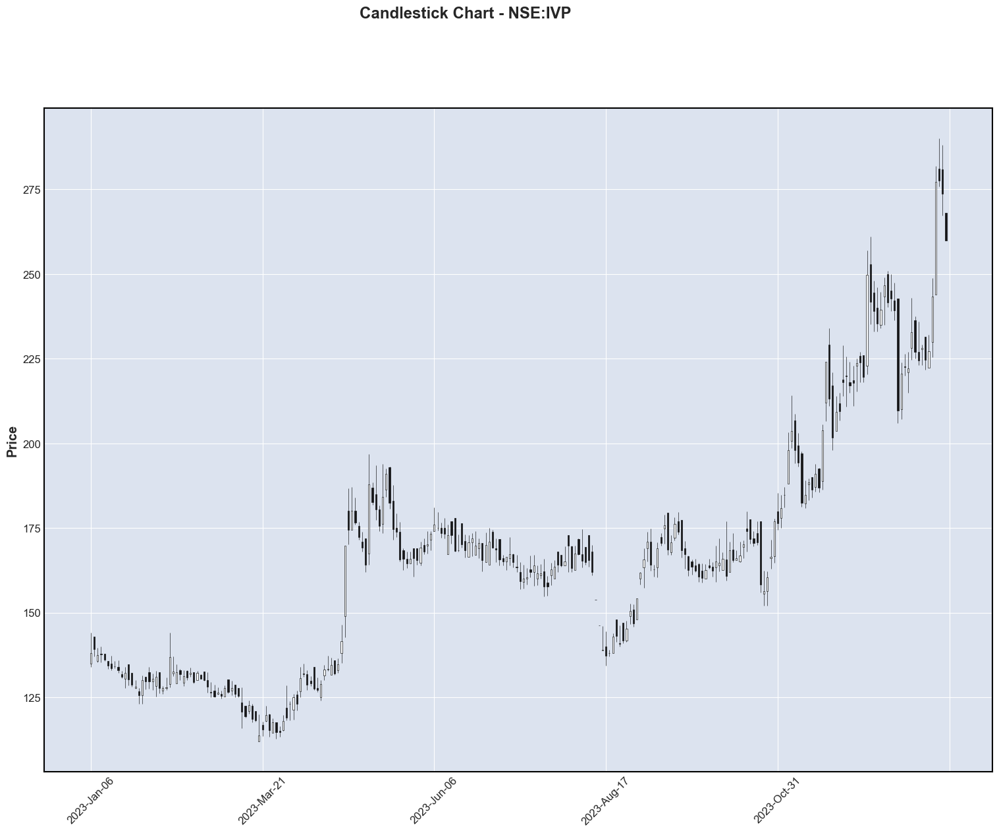

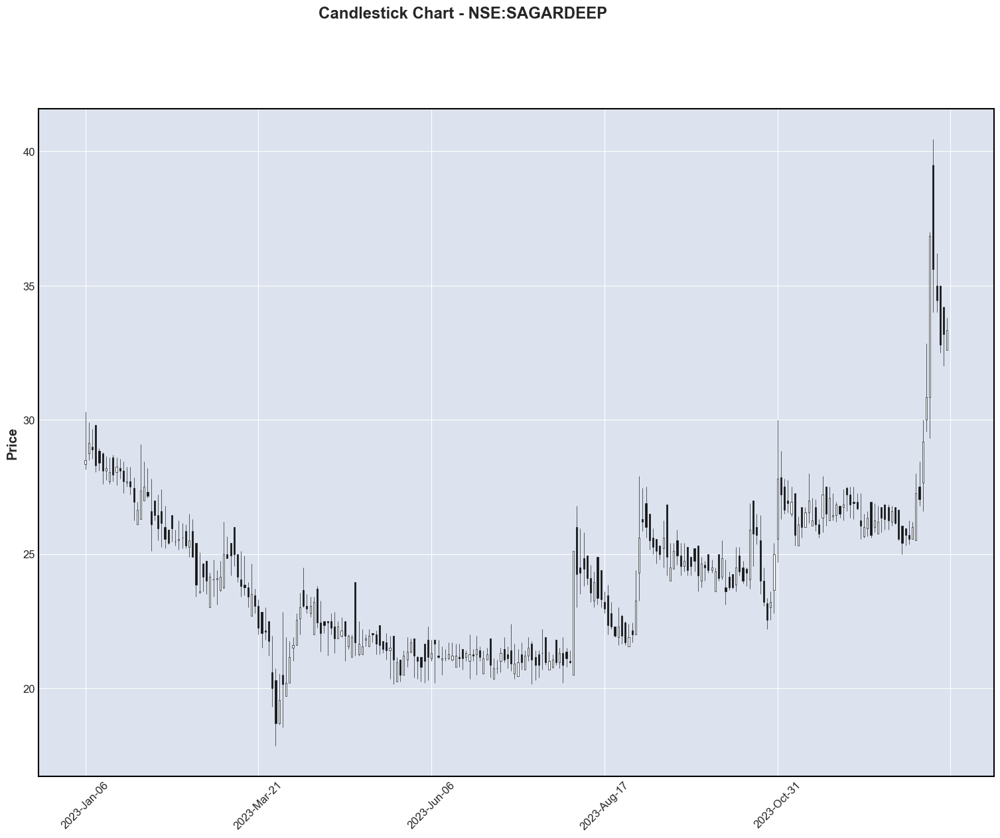

In [32]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Candlestick Chart
    mpf.plot(symbol_data.set_index('datetime'), type='candle', title=f'Candlestick Chart - {symbol}', ylabel='Price', figscale=2.5)

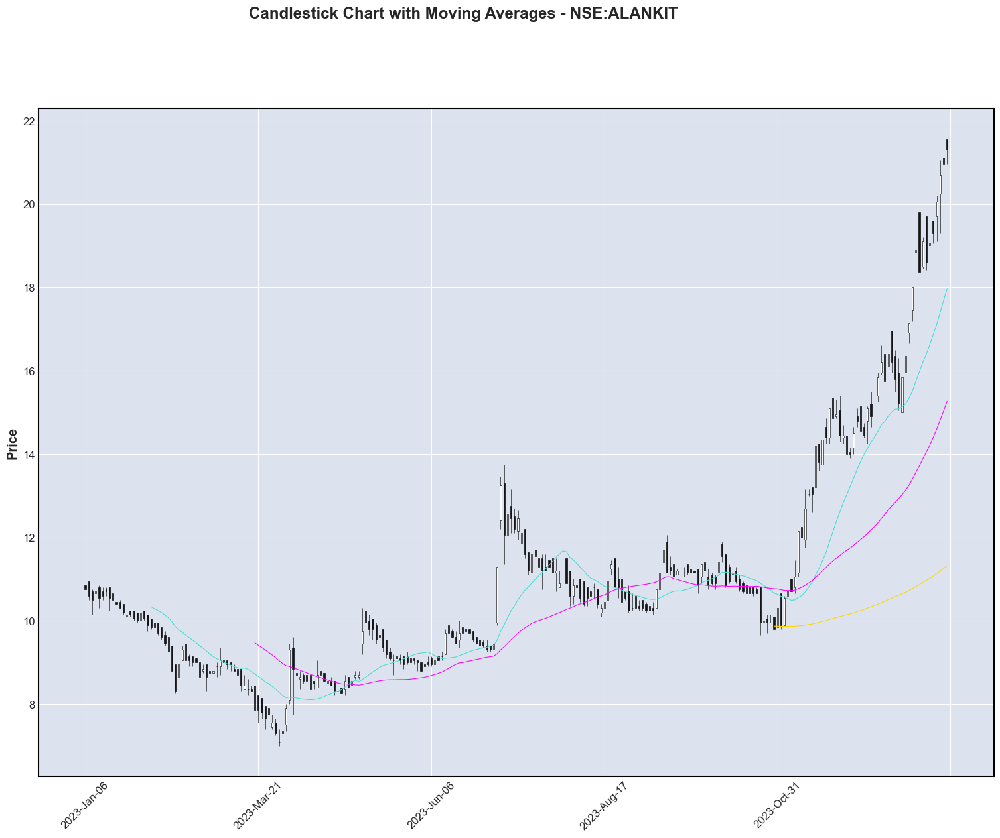

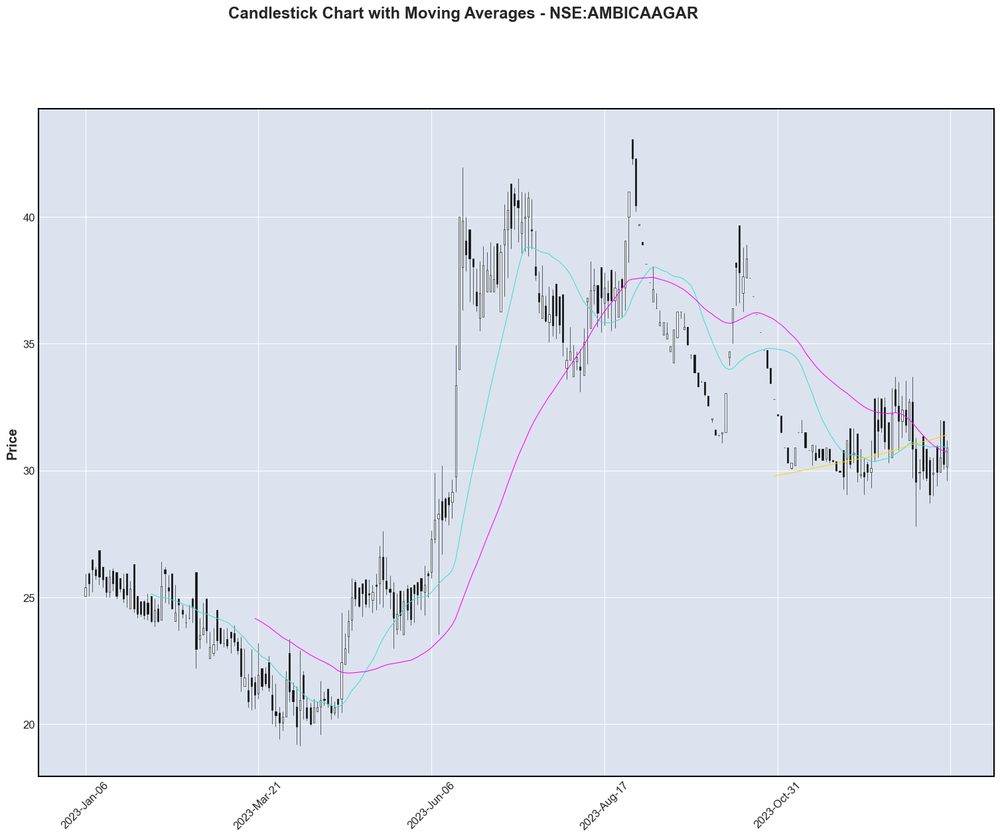

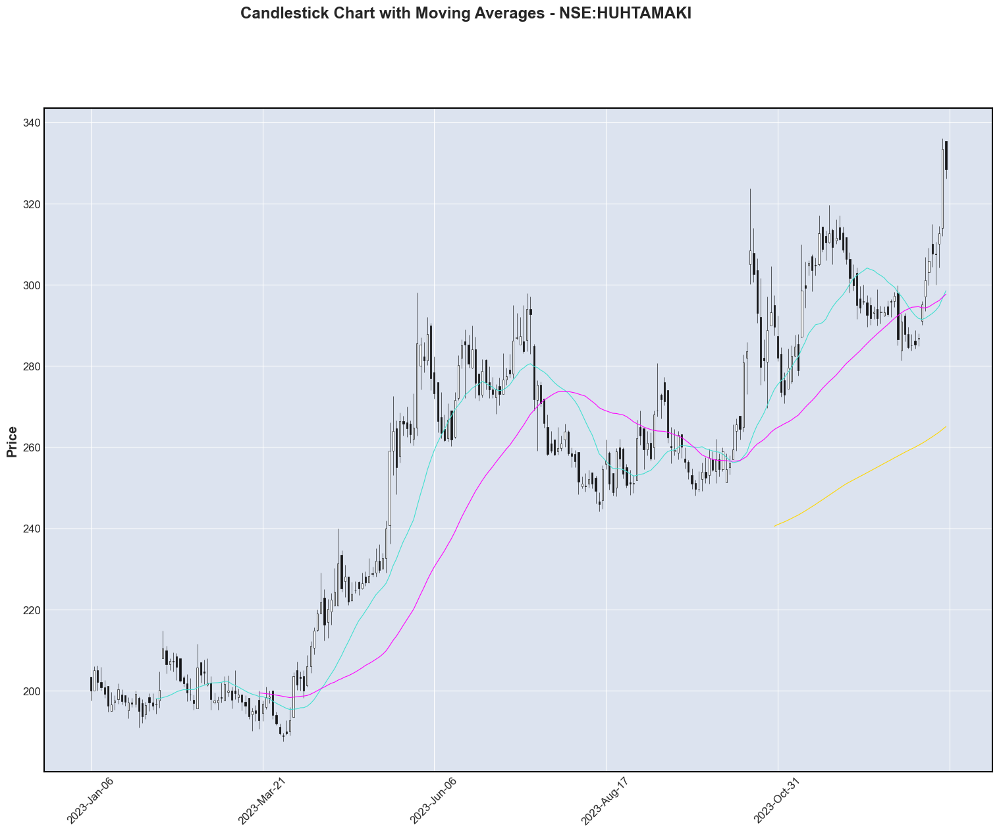

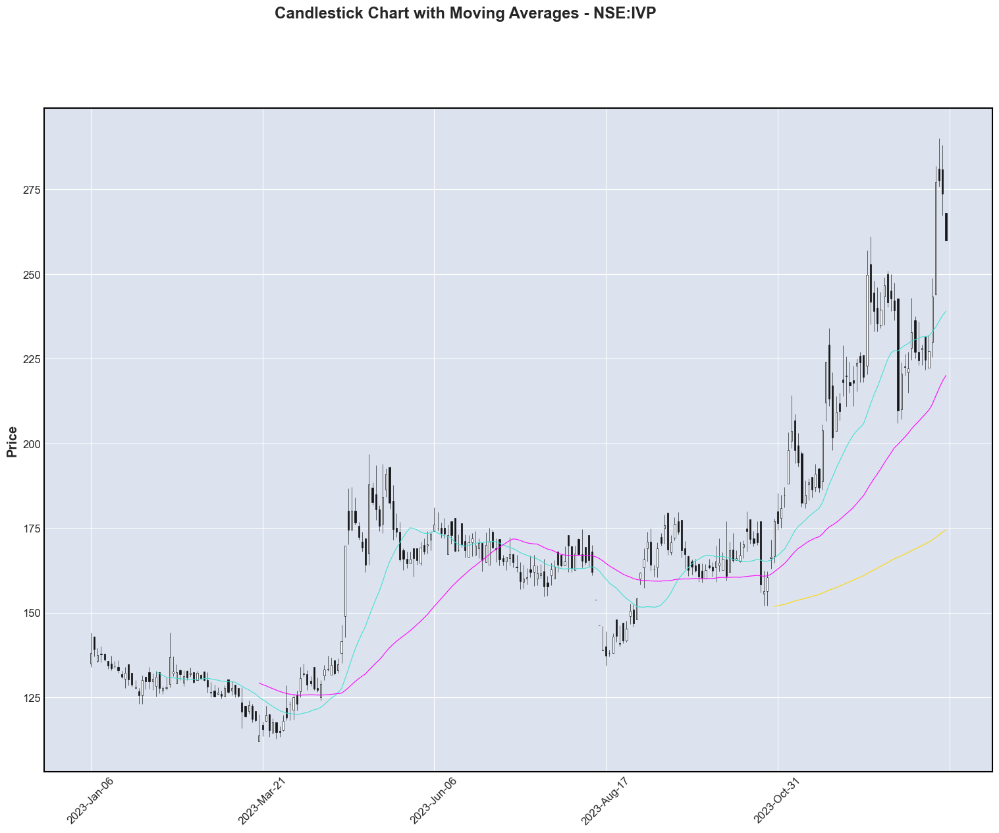

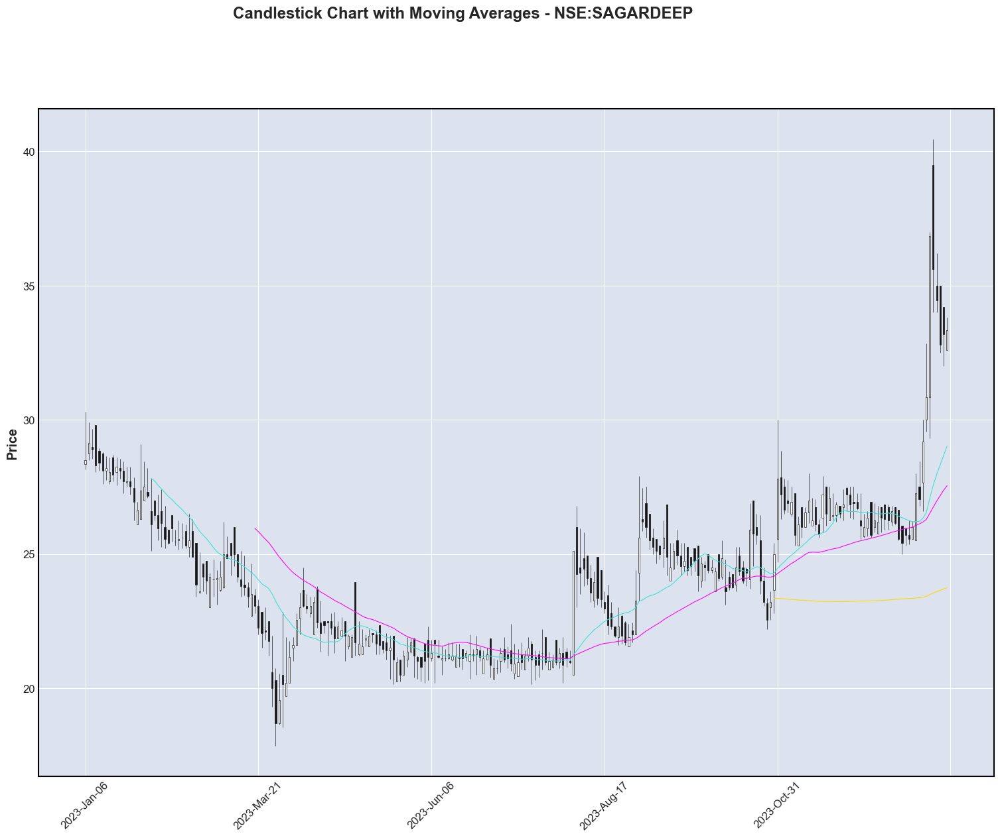

In [33]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Candlestick Chart with Moving Averages
    mpf.plot(symbol_data.set_index('datetime'), type='candle', title=f'Candlestick Chart with Moving Averages - {symbol}',
             ylabel='Price', mav=(20, 50, 200), figscale=2.5)

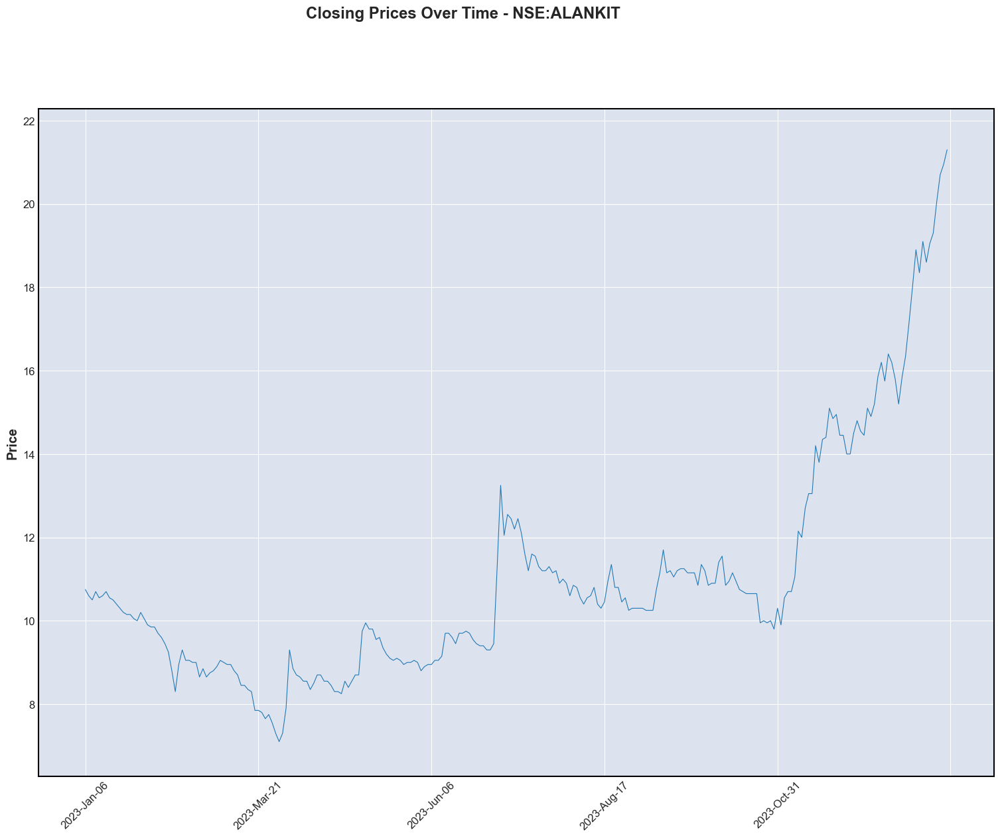

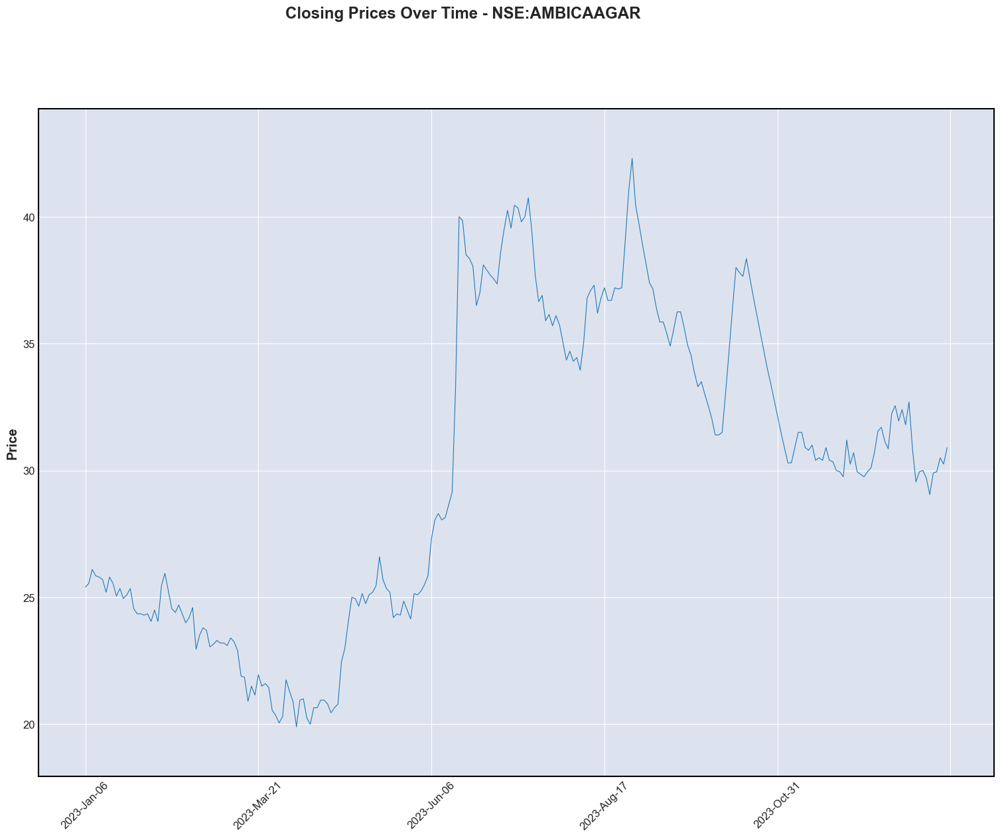

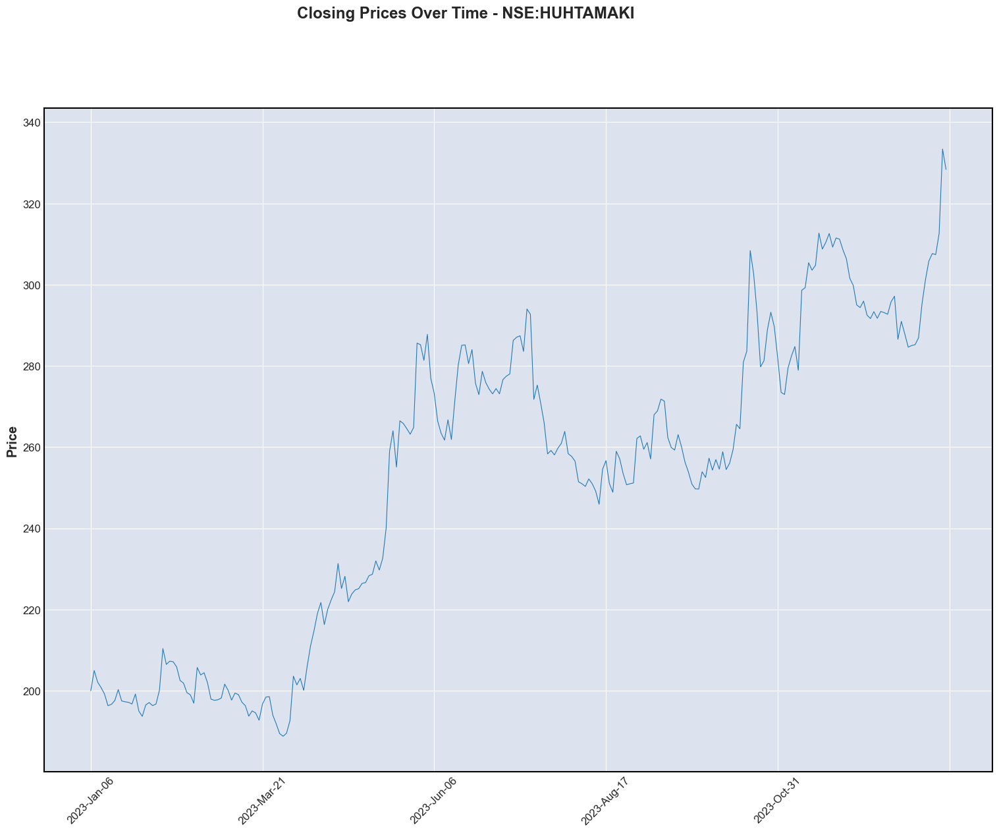

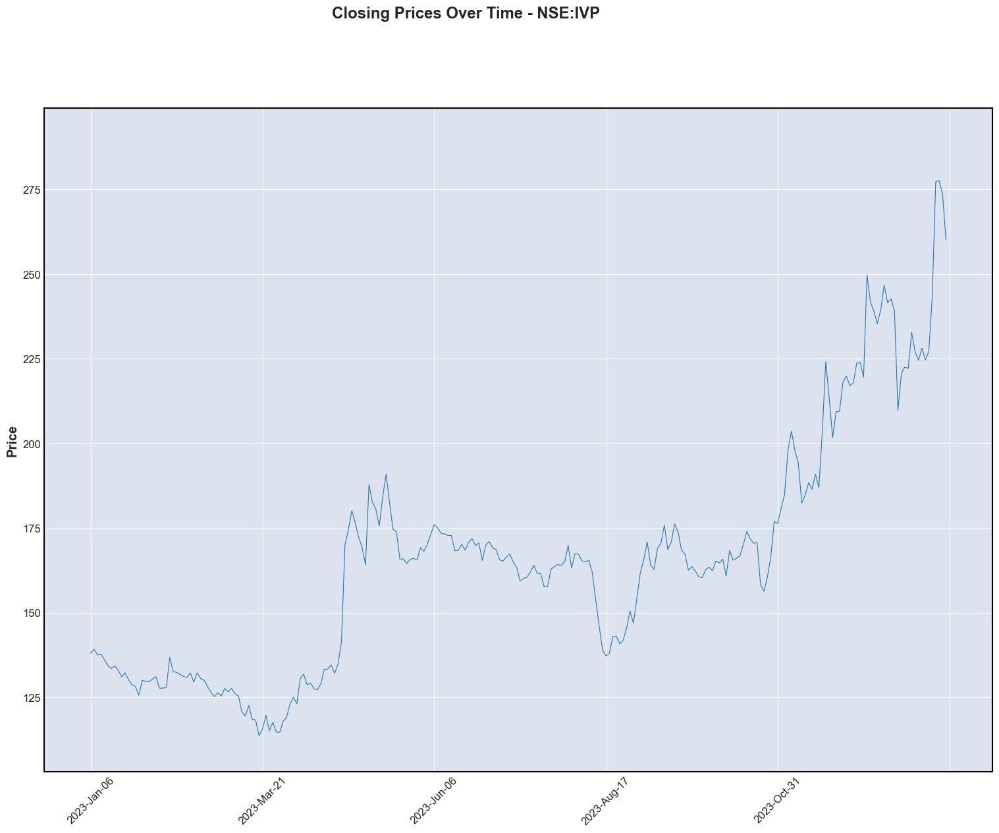

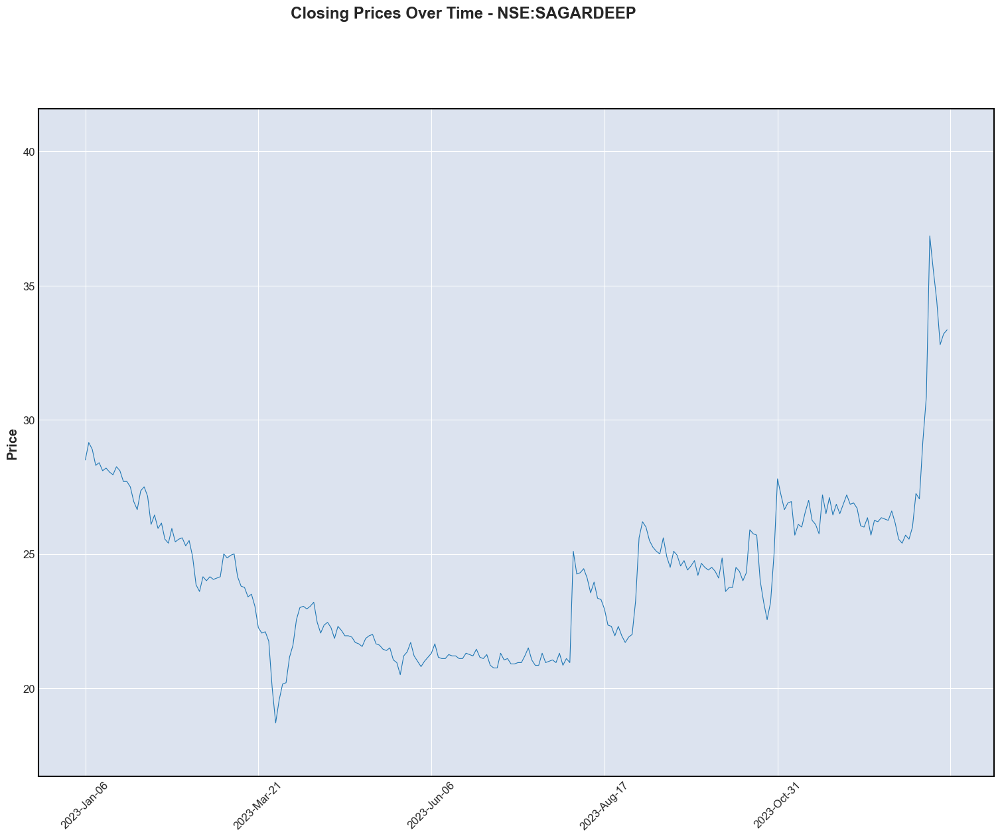

In [34]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Line Plot
    mpf.plot(symbol_data.set_index('datetime'), type='line', title=f'Closing Prices Over Time - {symbol}', ylabel='Price', figscale=2.5)

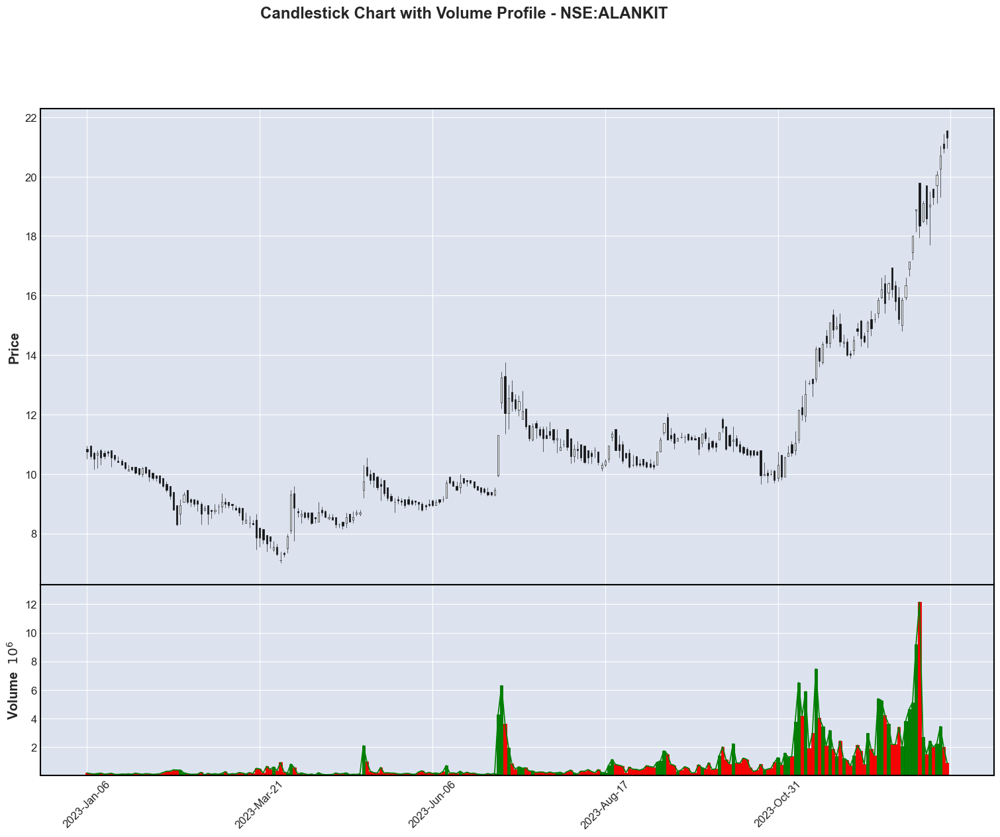

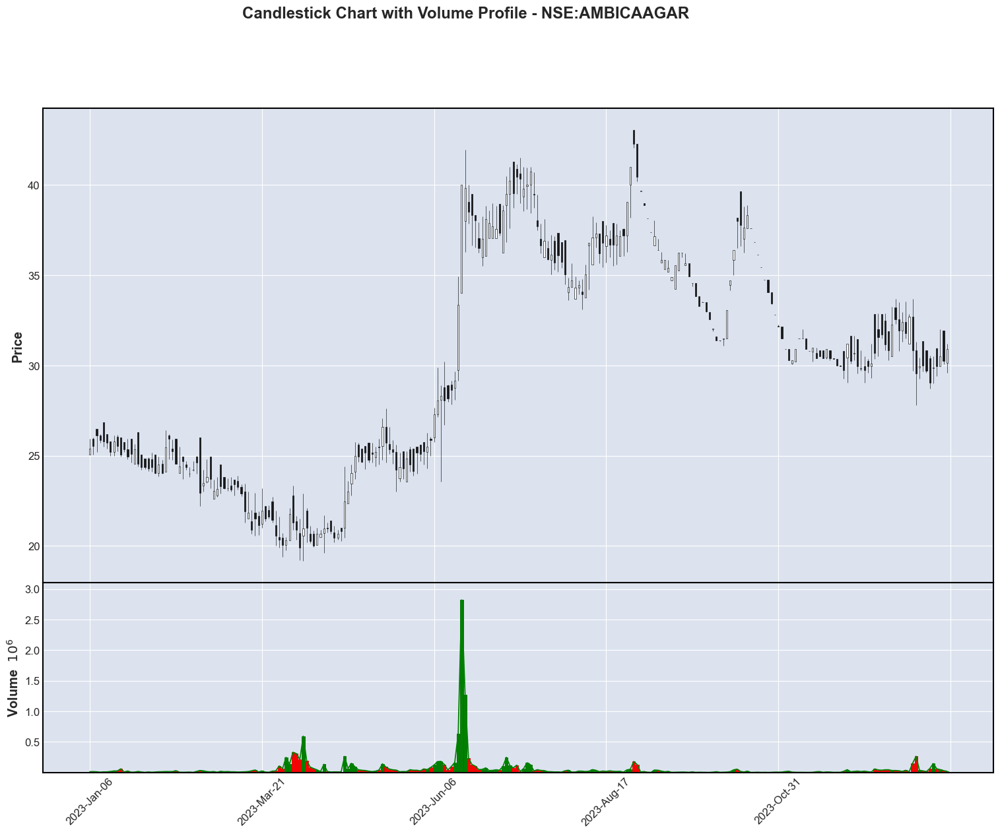

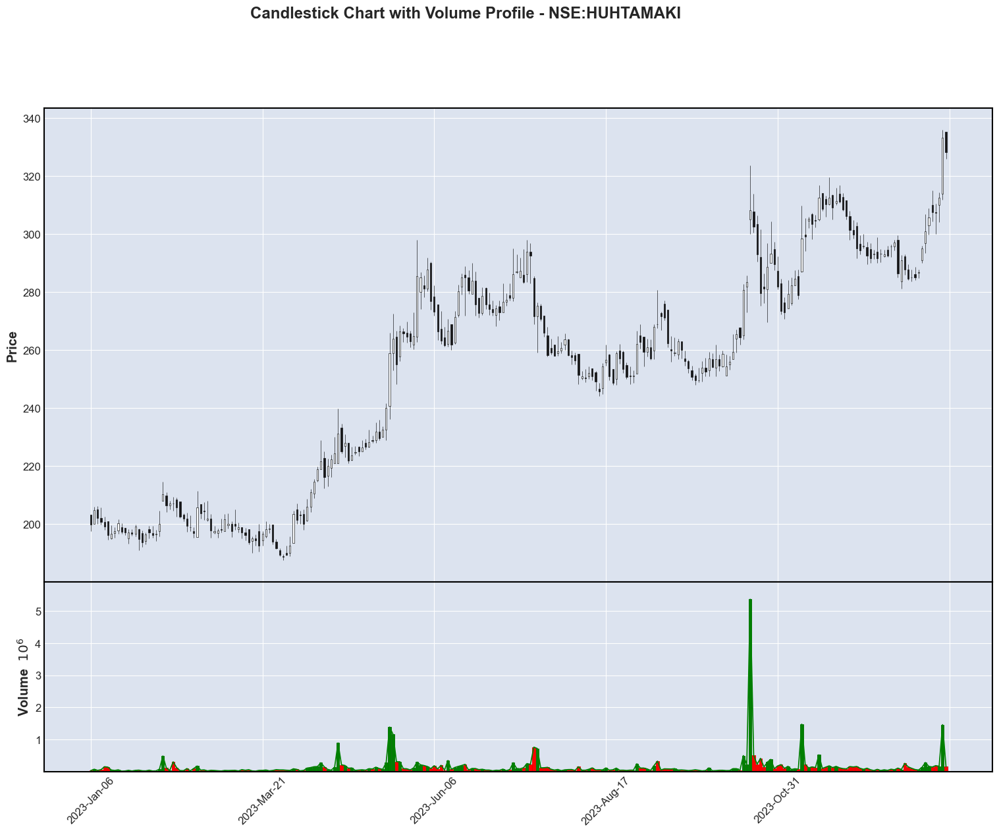

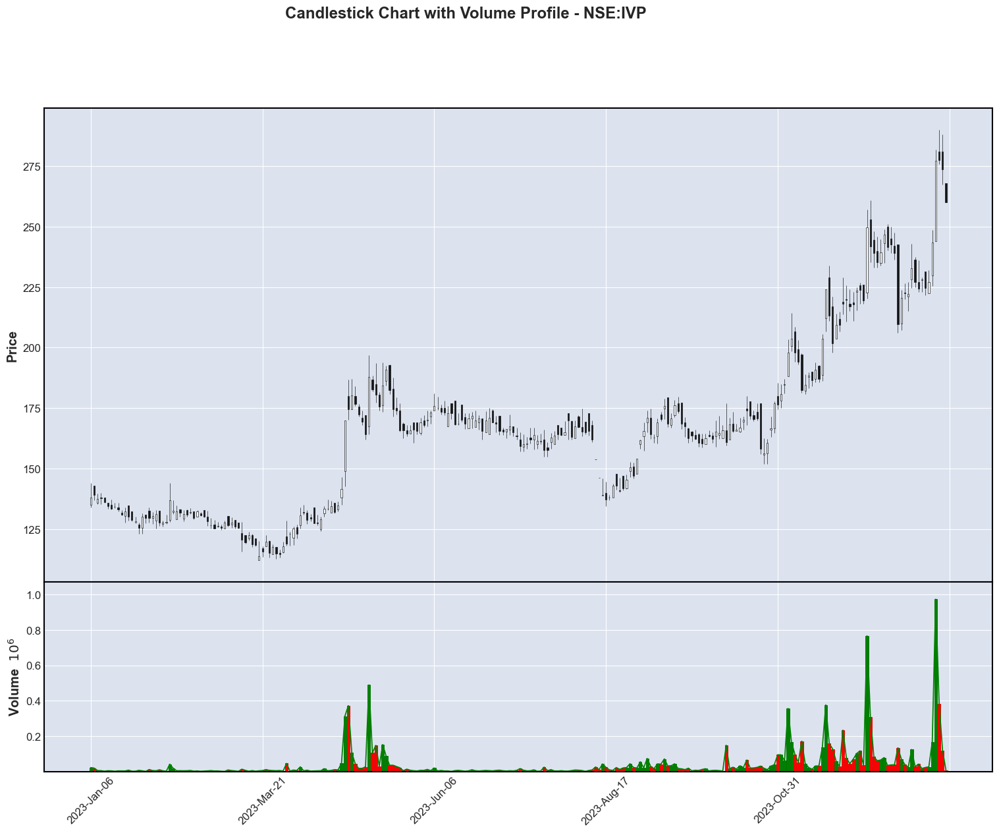

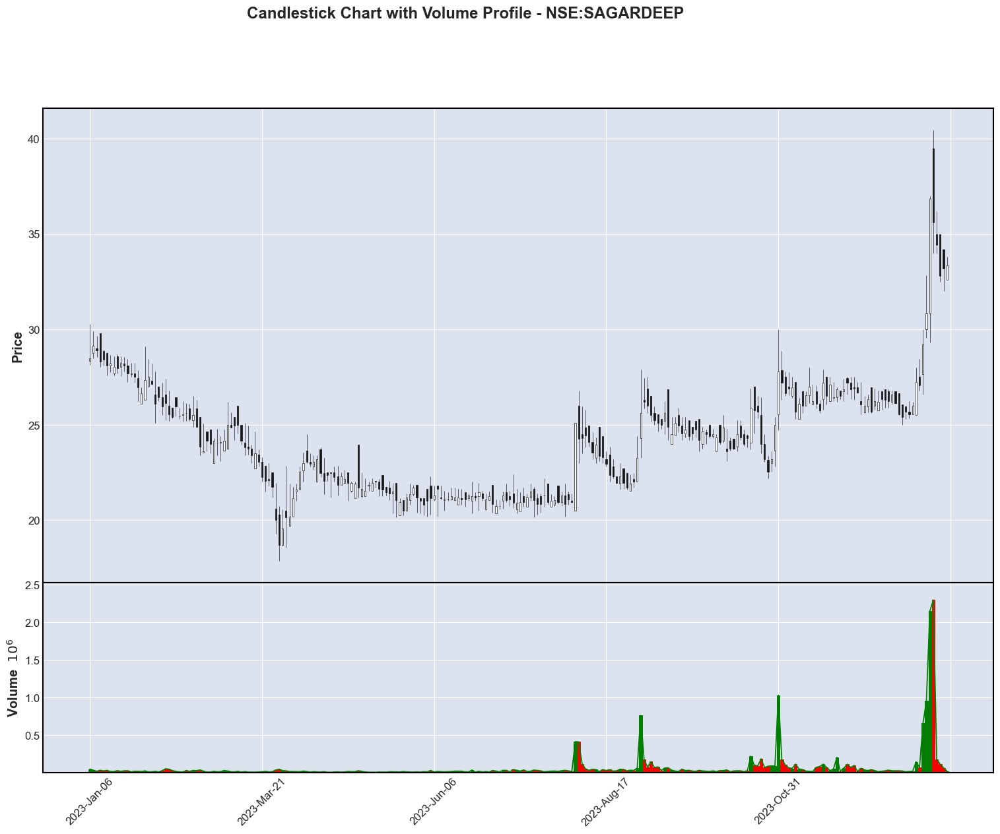

In [56]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Candlestick Chart with Volume Profile
    mpf.plot(symbol_data.set_index('datetime'), type='candle', title=f'Candlestick Chart with Volume Profile - {symbol}',
             ylabel='Price', volume=True, addplot=mpf.make_addplot(symbol_data['volume'], panel=1, color='g'), figscale=2.5)

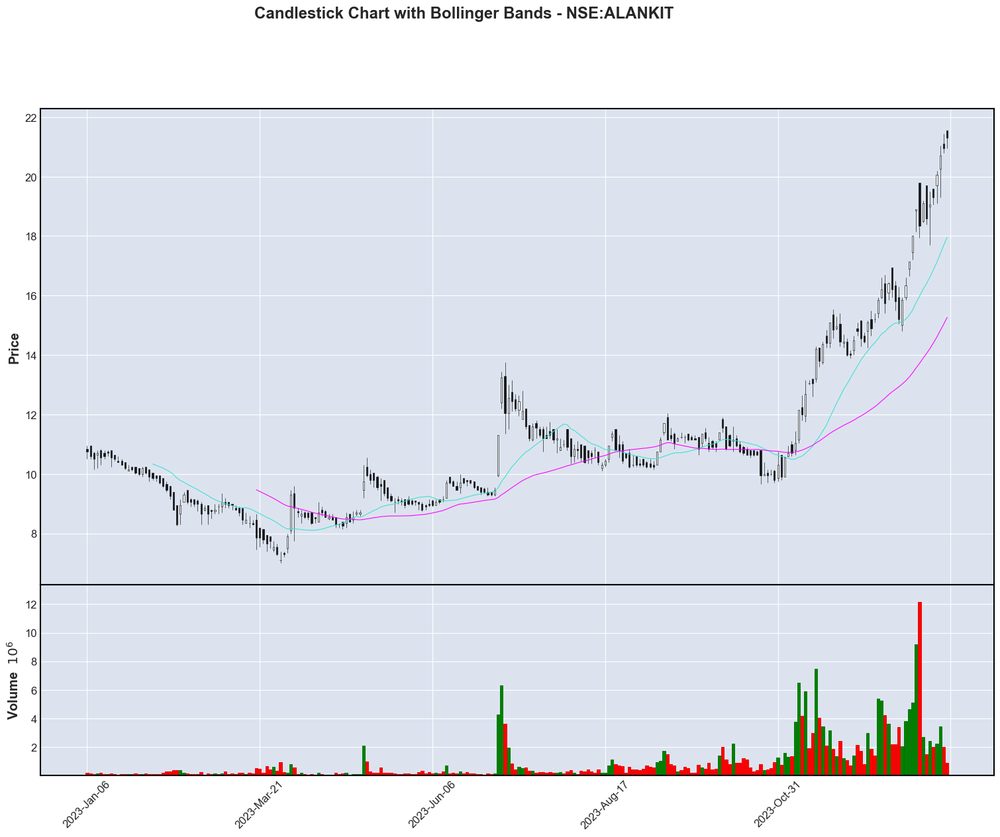

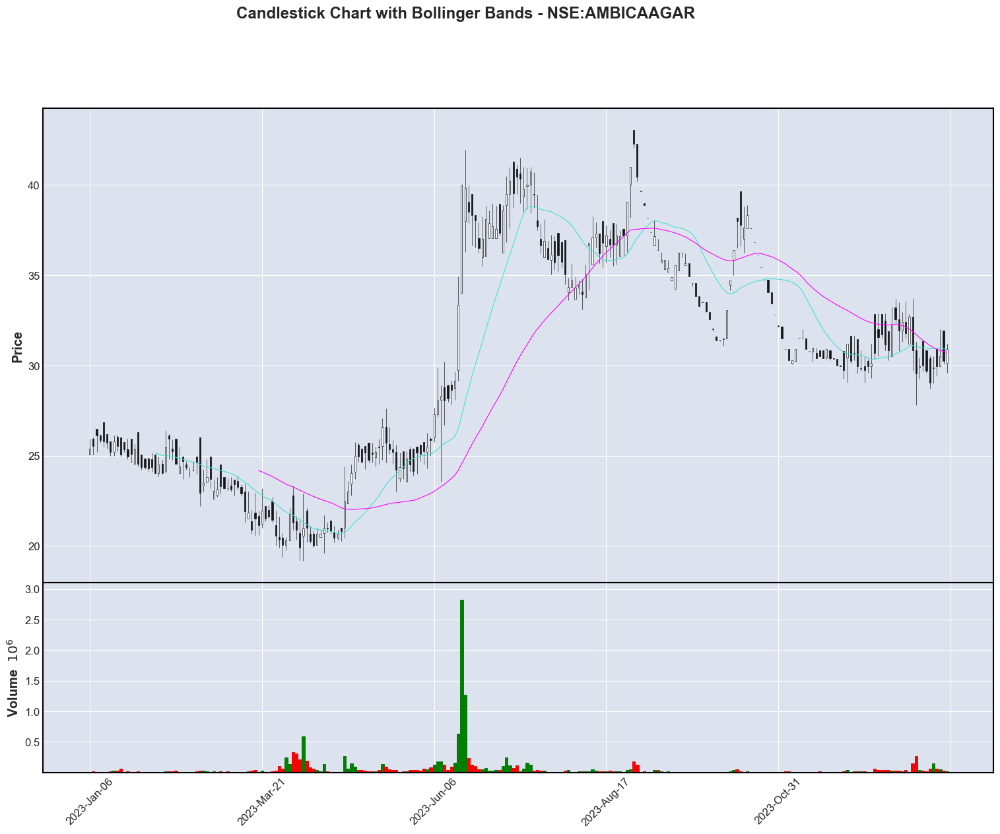

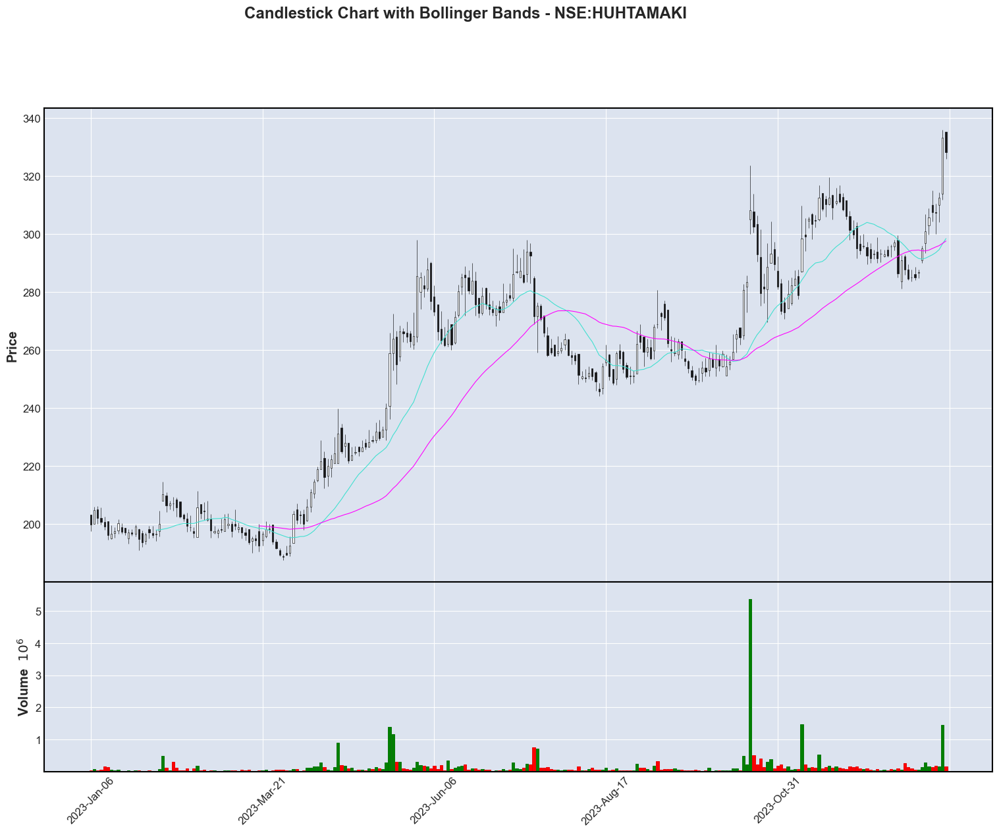

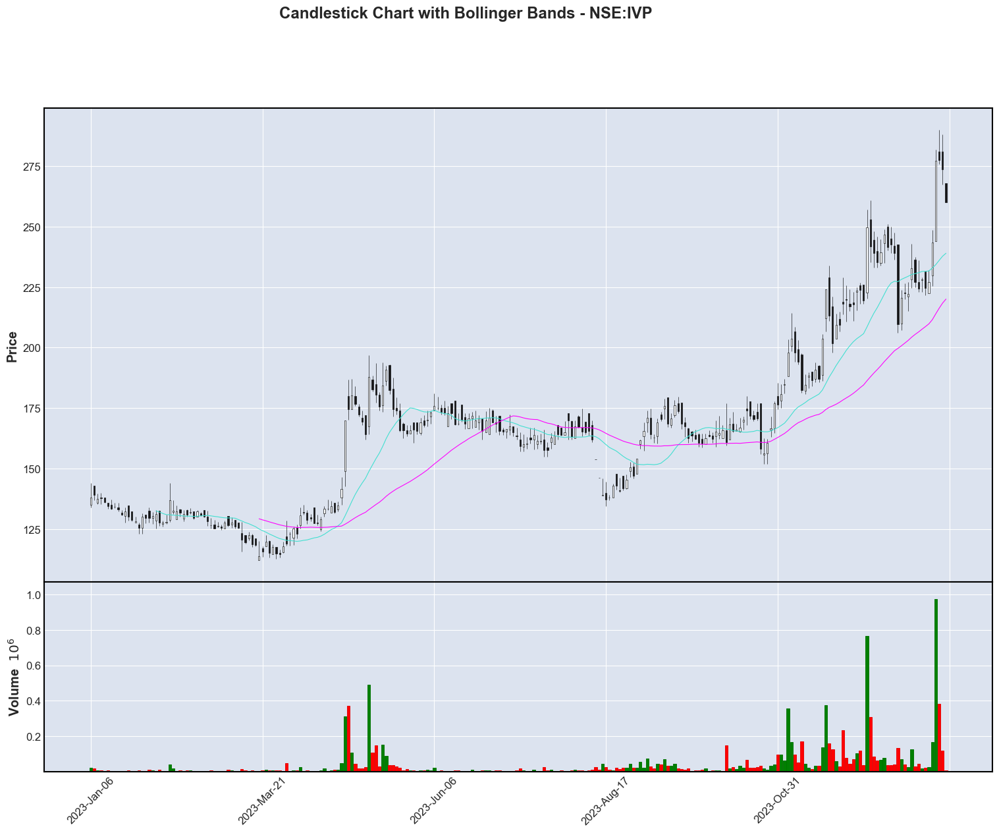

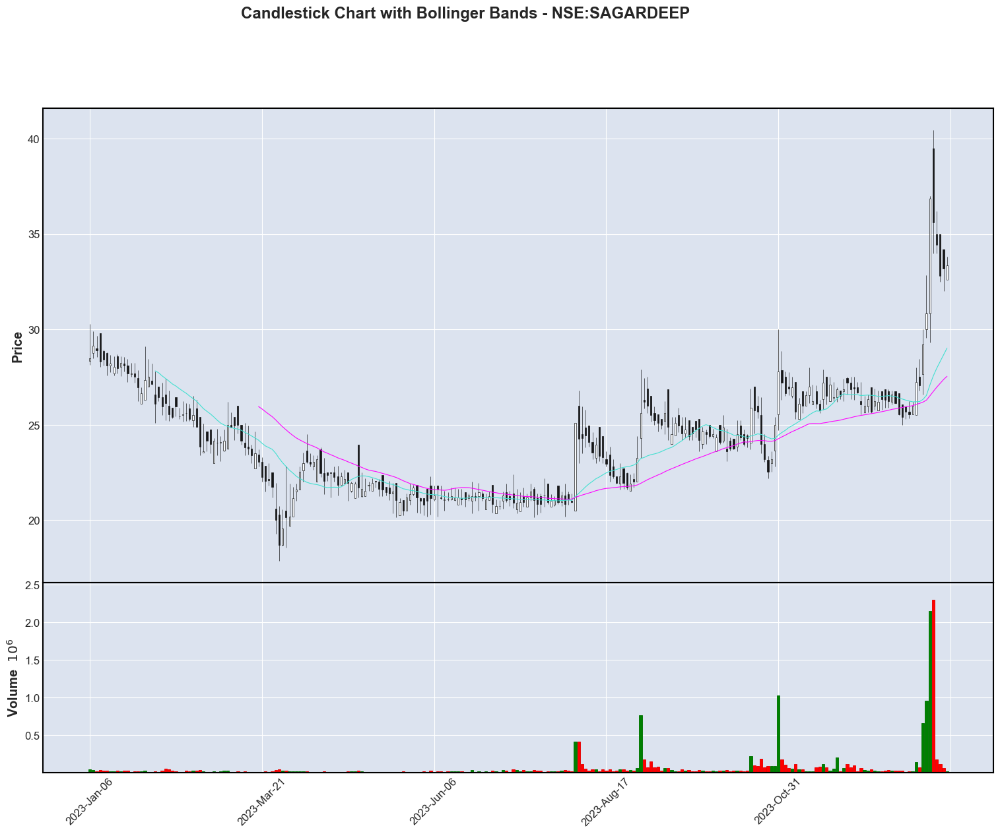

In [41]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Candlestick Chart with Bollinger Bands
    mpf.plot(symbol_data.set_index('datetime'), type='candle', title=f'Candlestick Chart with Bollinger Bands - {symbol}',
             ylabel='Price', mav=(20, 50), volume=True, figscale=2.5)

c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:129: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  high = highs[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:130: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  low = lows[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positi

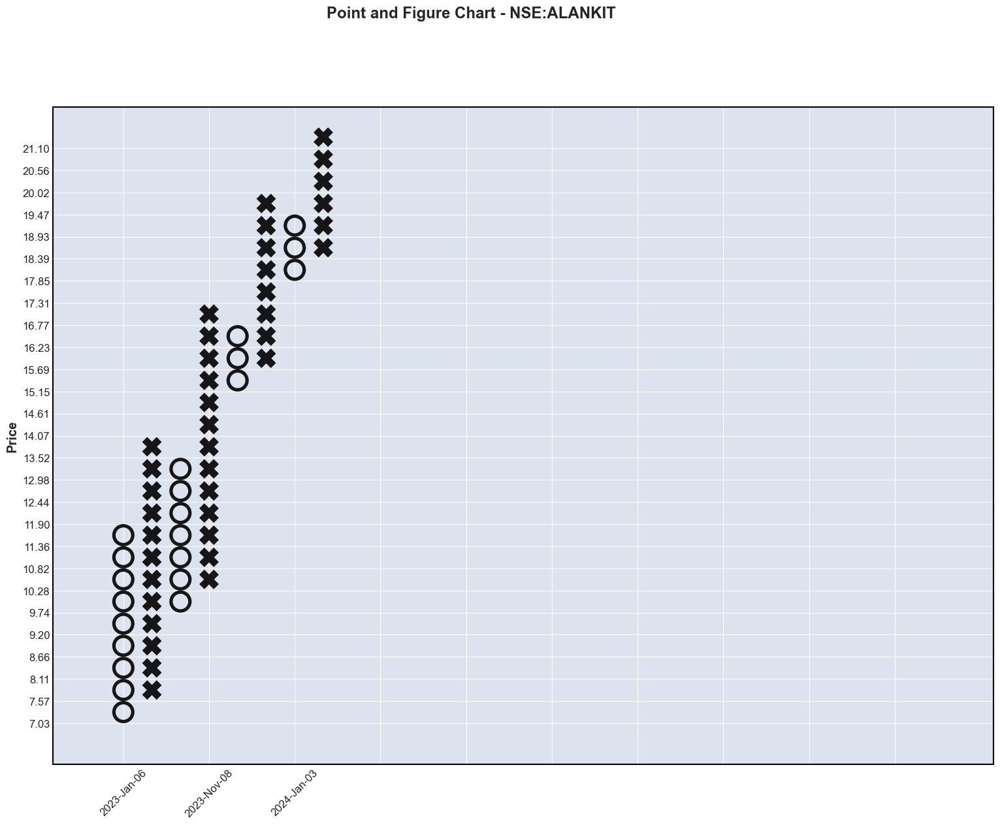

c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:129: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  high = highs[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:130: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  low = lows[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positi

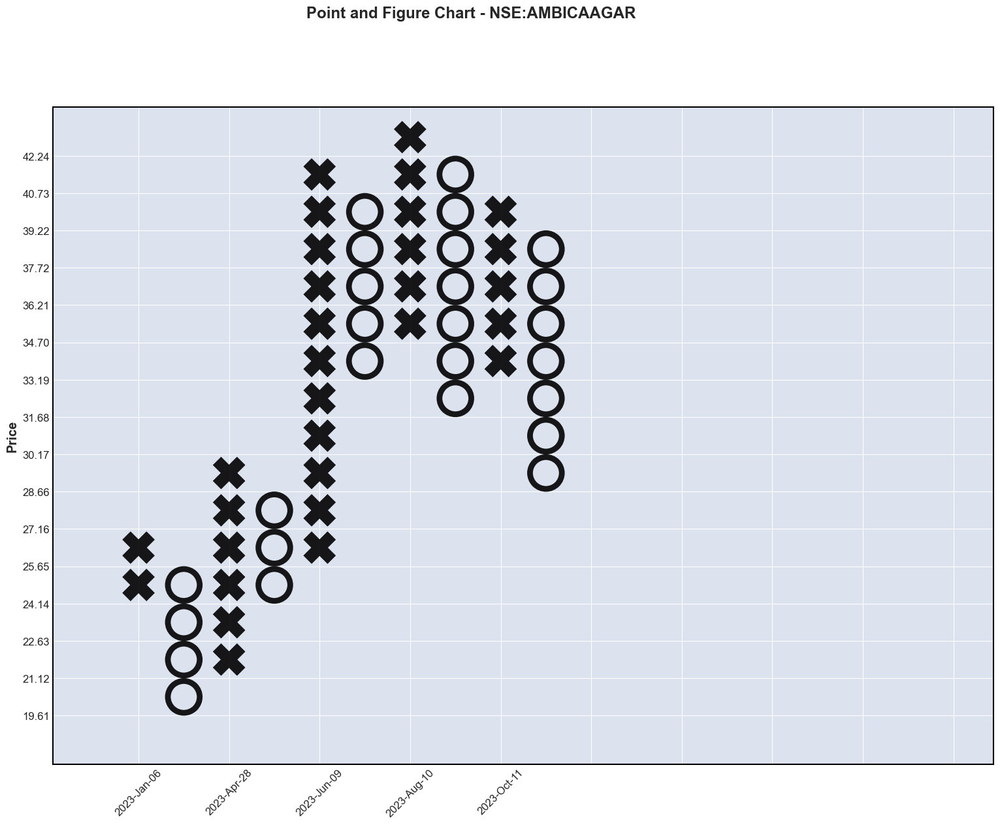

c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:129: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  high = highs[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:130: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  low = lows[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positi

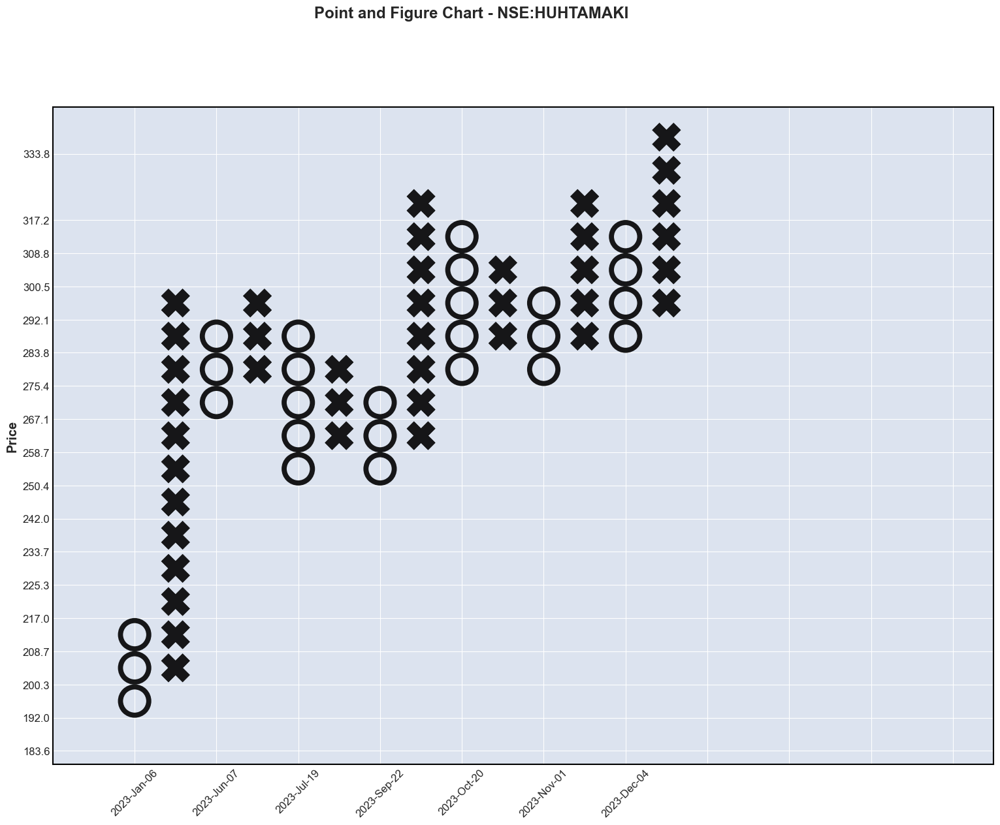

c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:129: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  high = highs[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:130: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  low = lows[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positi

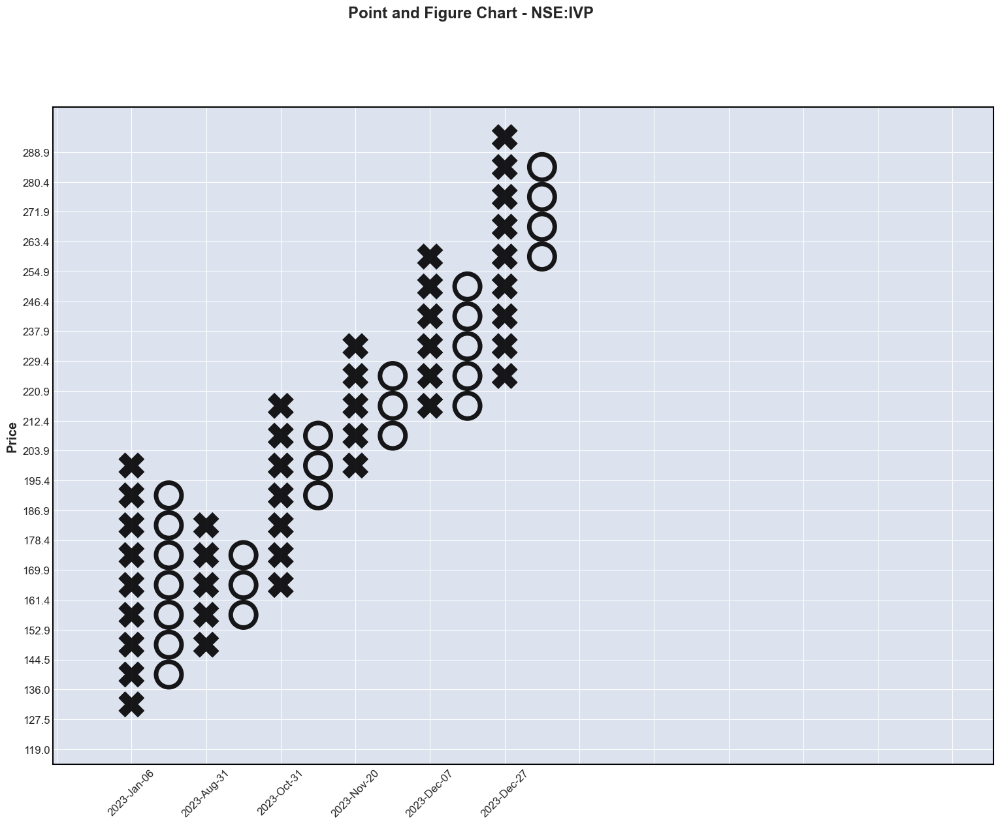

c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:129: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  high = highs[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:130: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  low = lows[i]
c:\Users\ACER\AppData\Local\Programs\Python\Python310\lib\site-packages\mplfinance\_utils.py:131: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by positi

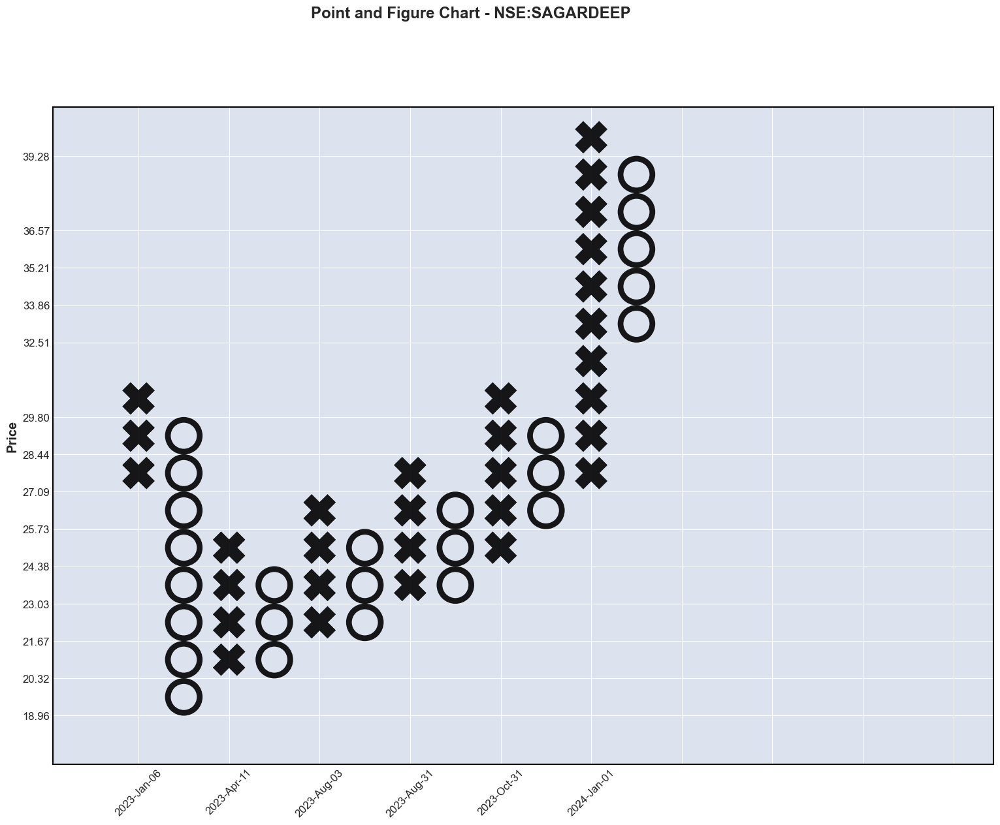

In [42]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Point and Figure Chart
    mpf.plot(symbol_data.set_index('datetime'), type='pnf', title=f'Point and Figure Chart - {symbol}', ylabel='Price', figscale=2.5)

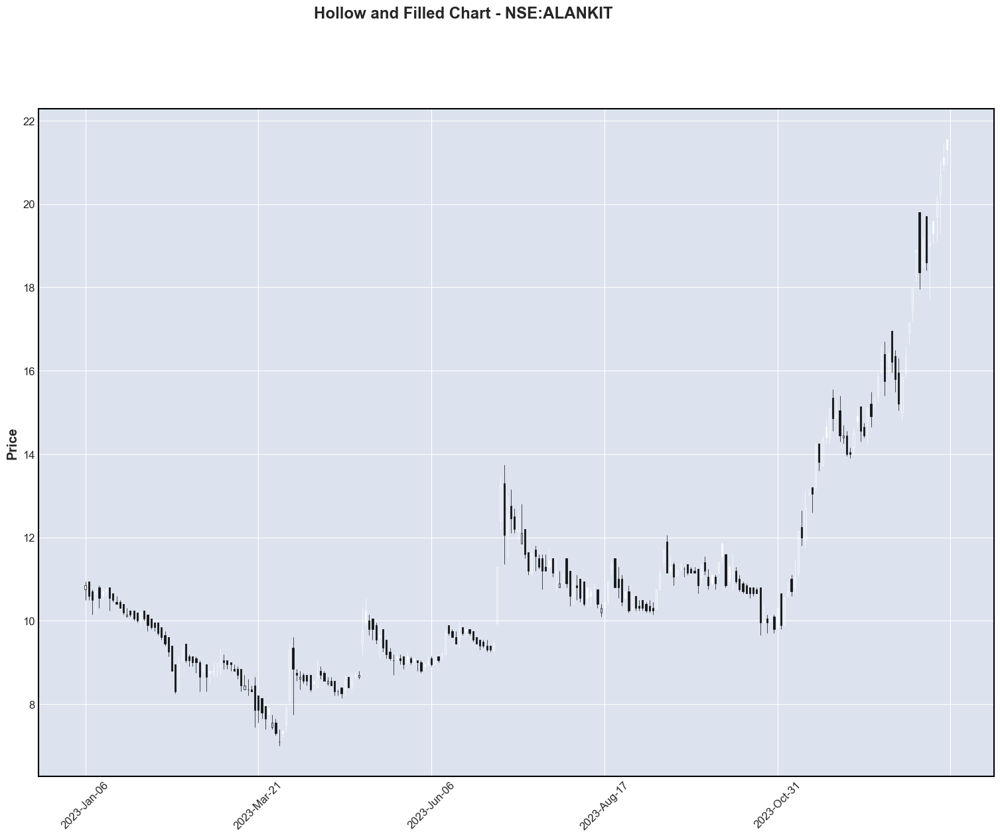

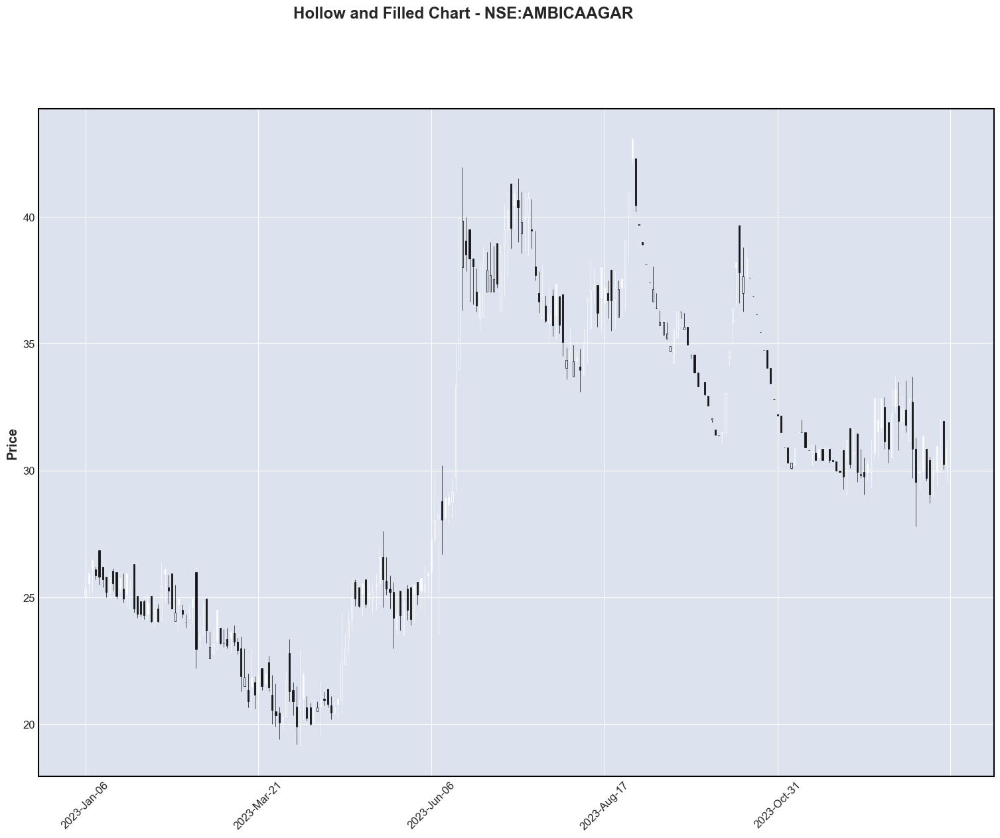

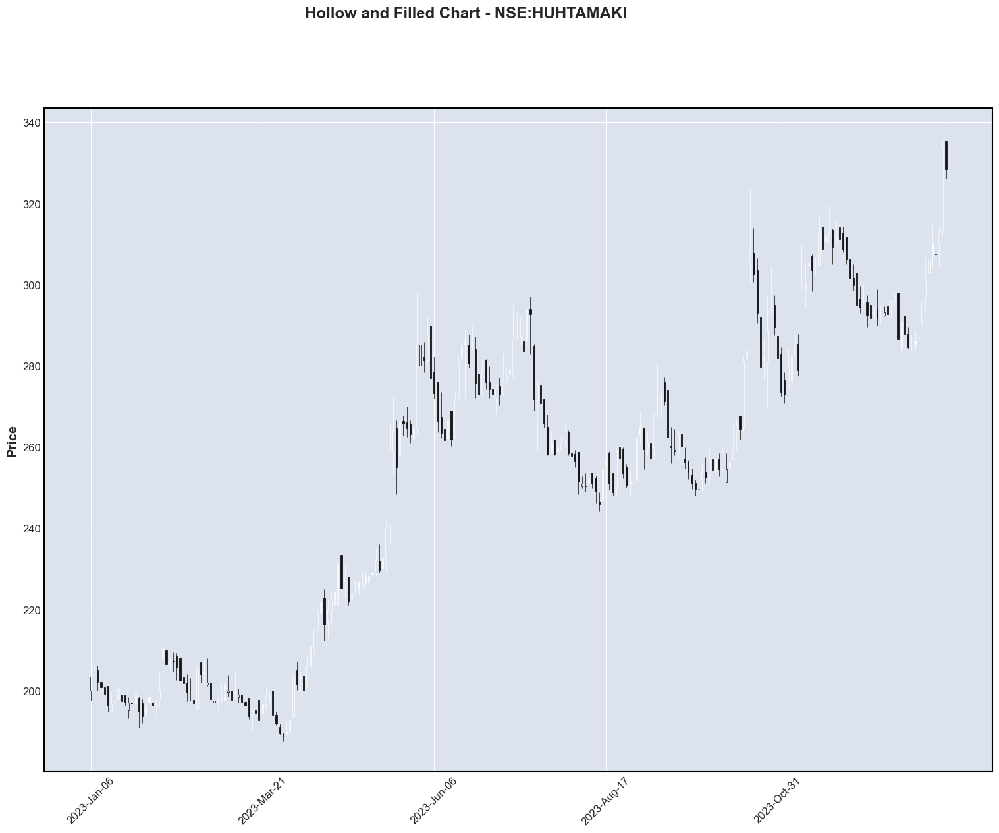

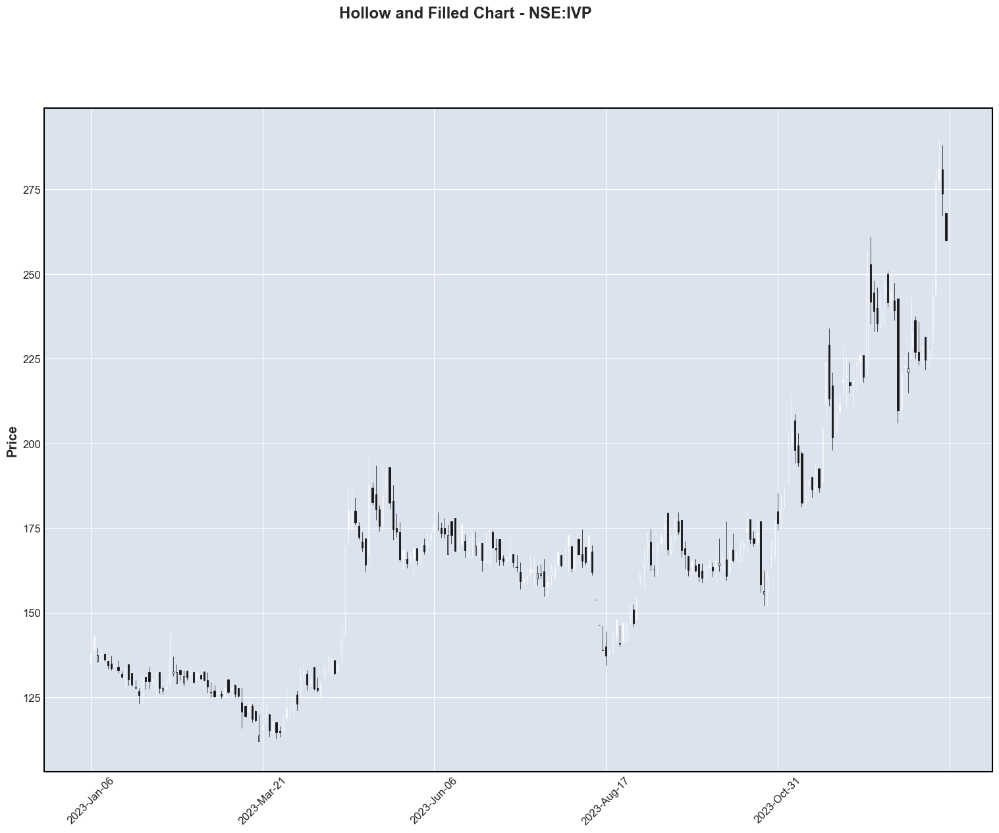

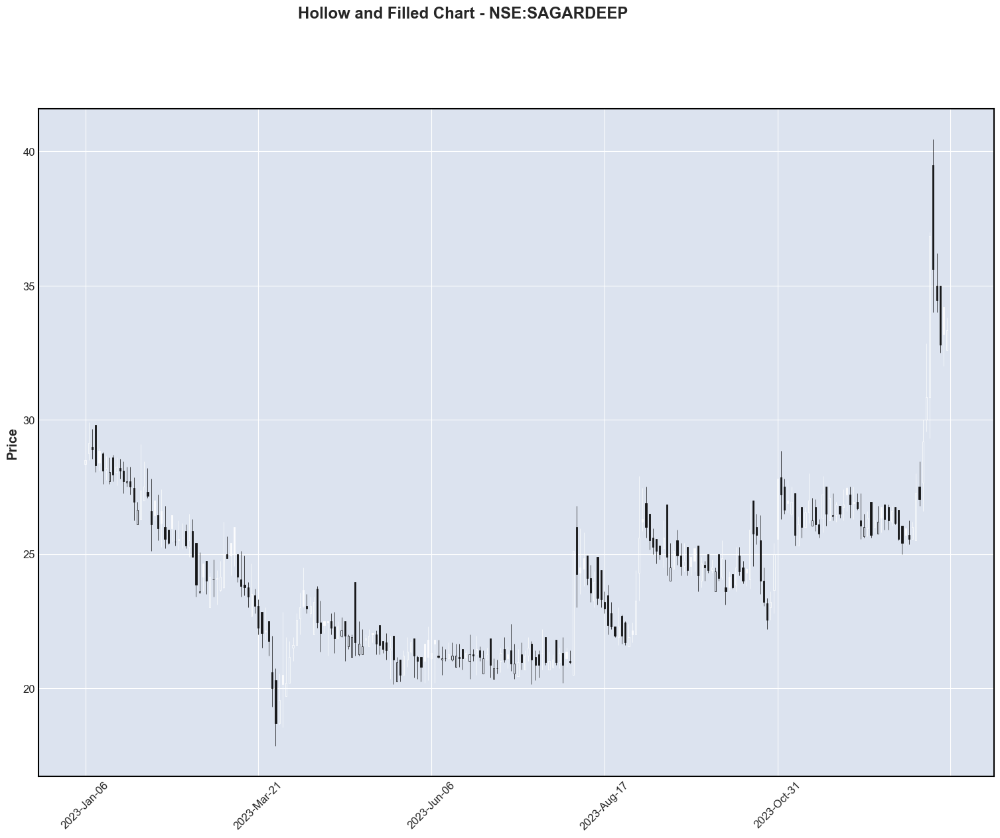

In [43]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Hollow and Filled Chart
    mpf.plot(symbol_data.set_index('datetime'), type='hollow_and_filled', title=f'Hollow and Filled Chart - {symbol}', ylabel='Price', figscale=2.5)

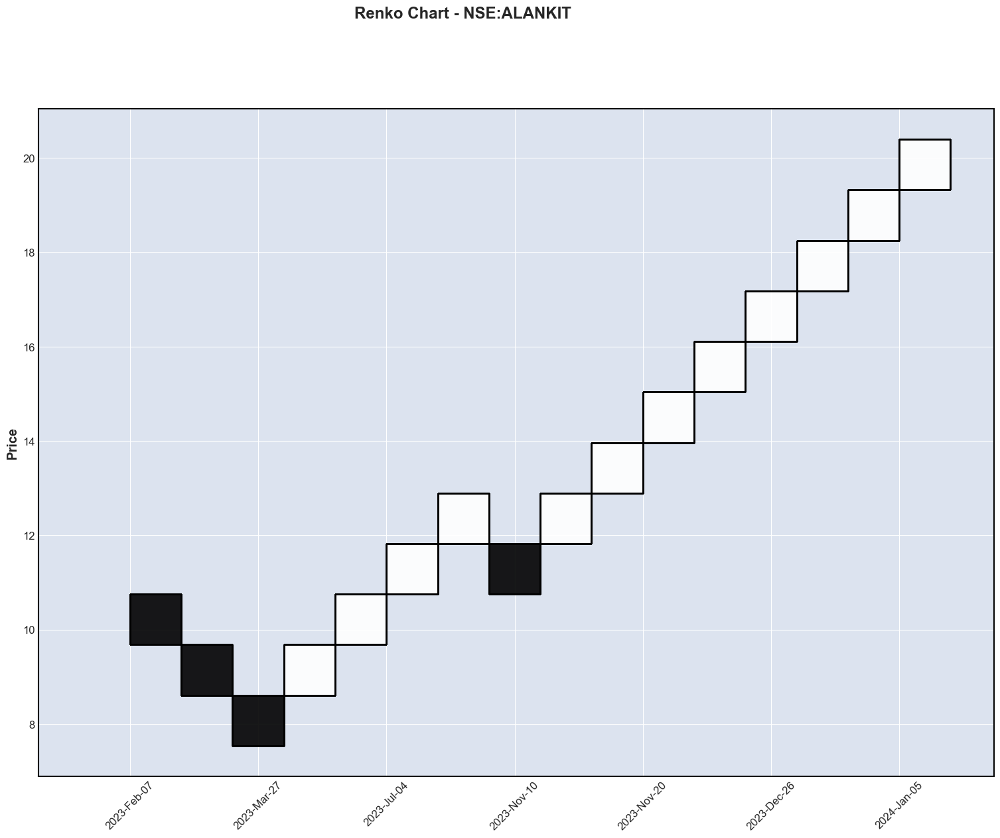

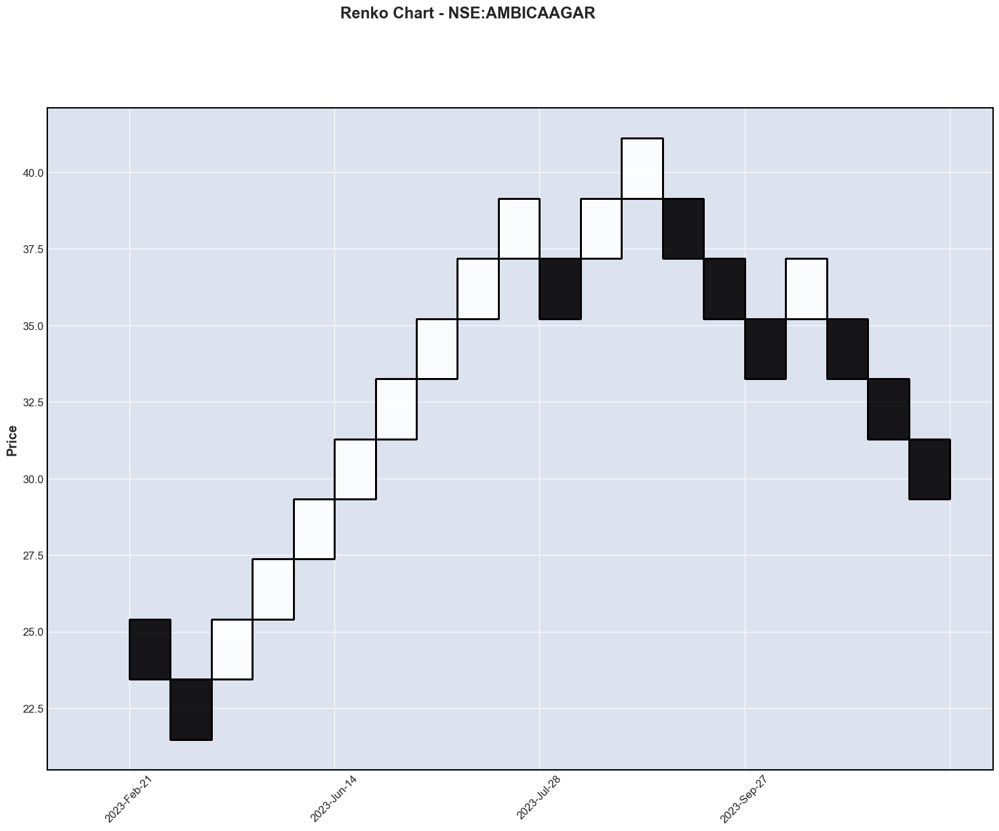

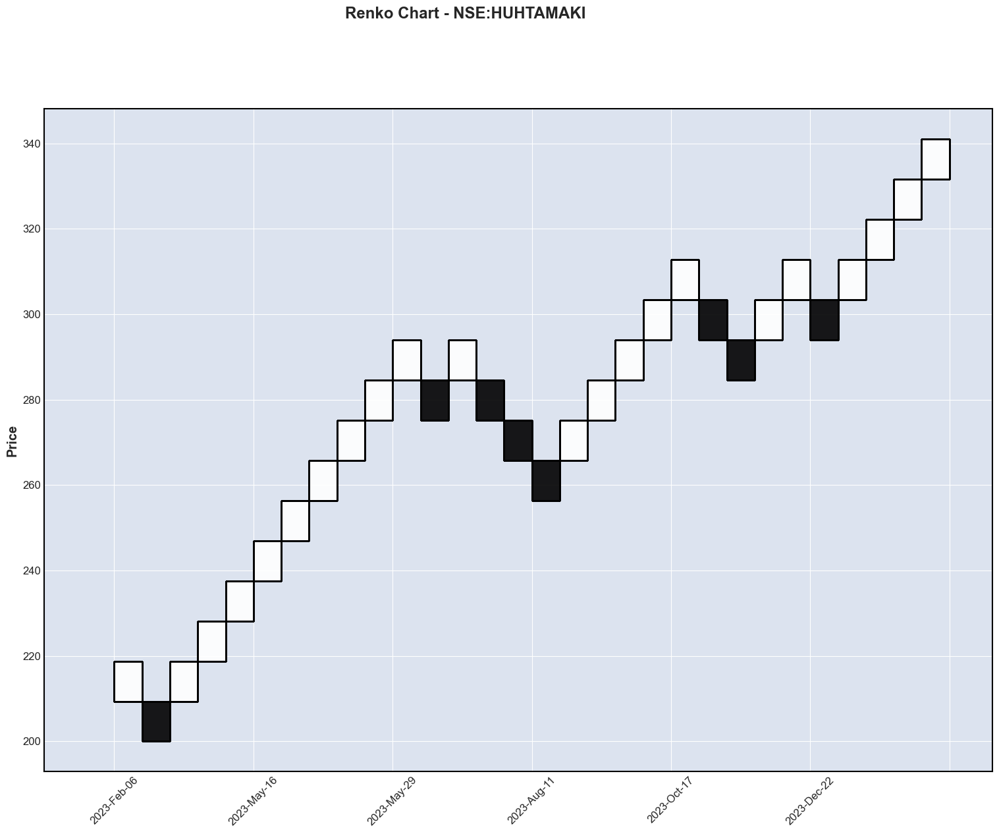

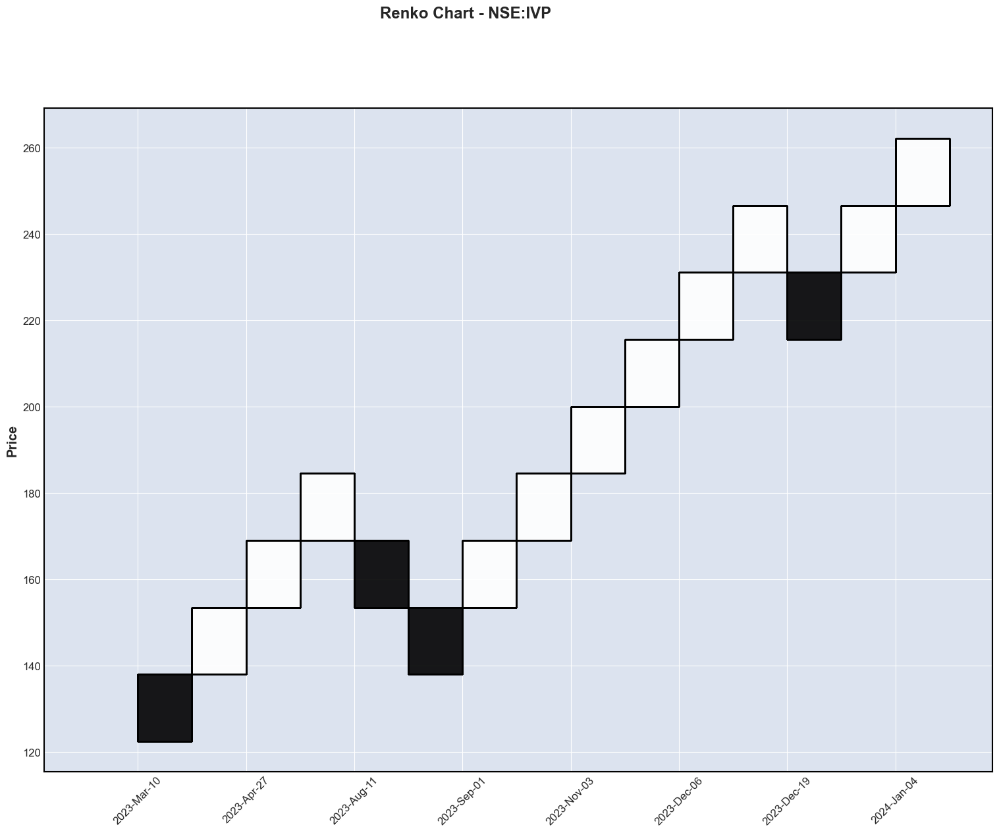

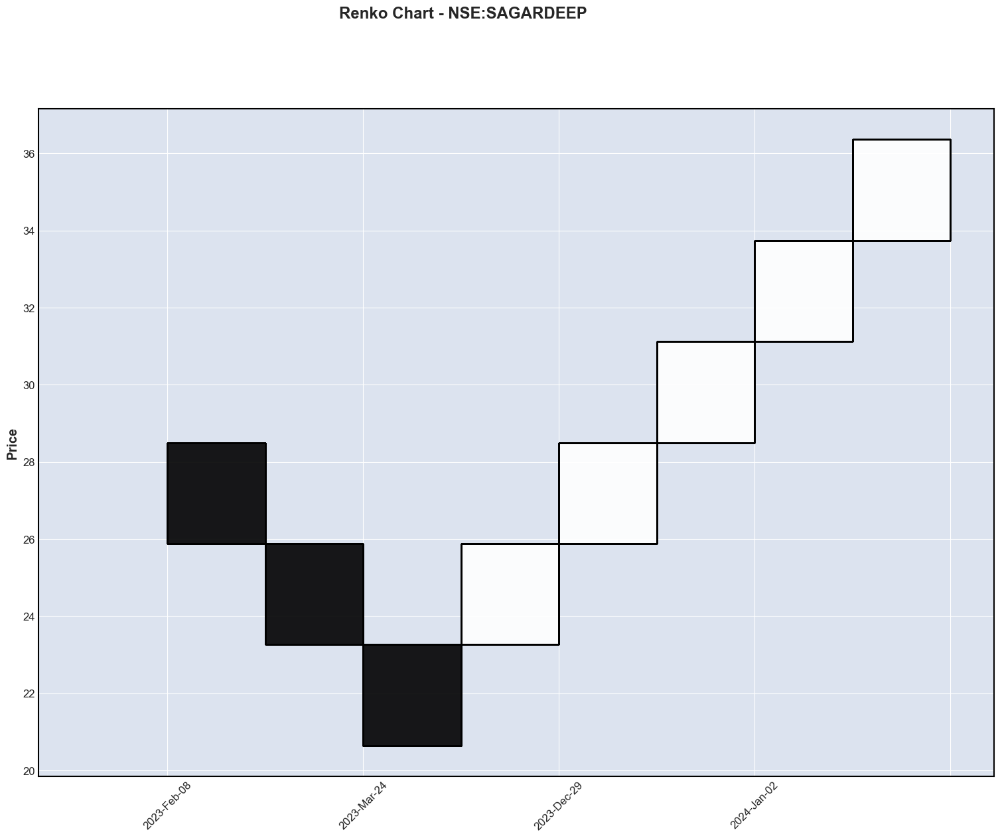

In [44]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    # Renko Chart
    mpf.plot(symbol_data.set_index('datetime'), type='renko', title=f'Renko Chart - {symbol}', ylabel='Price', figscale=2.5)

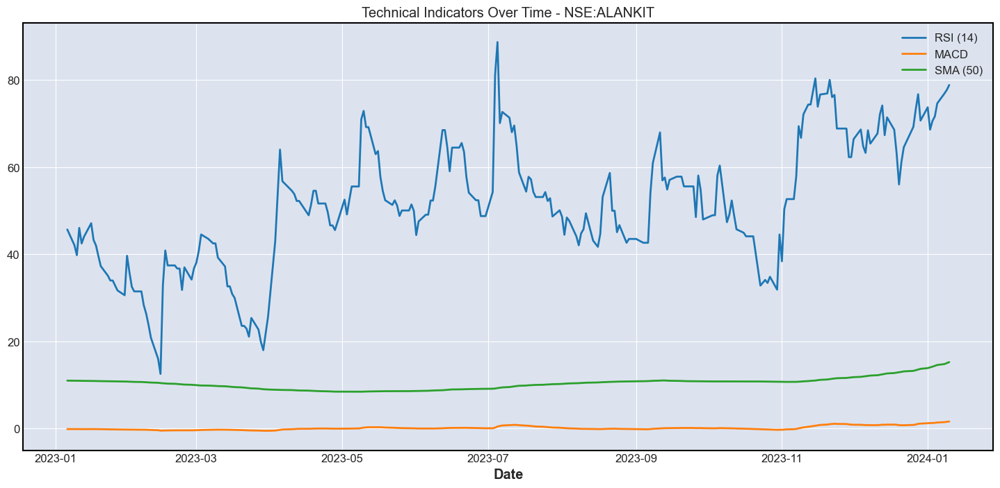

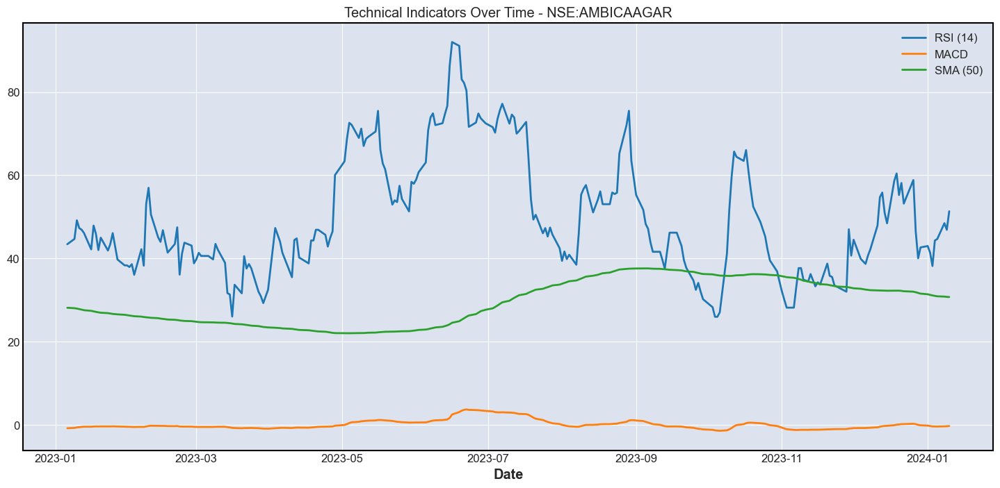

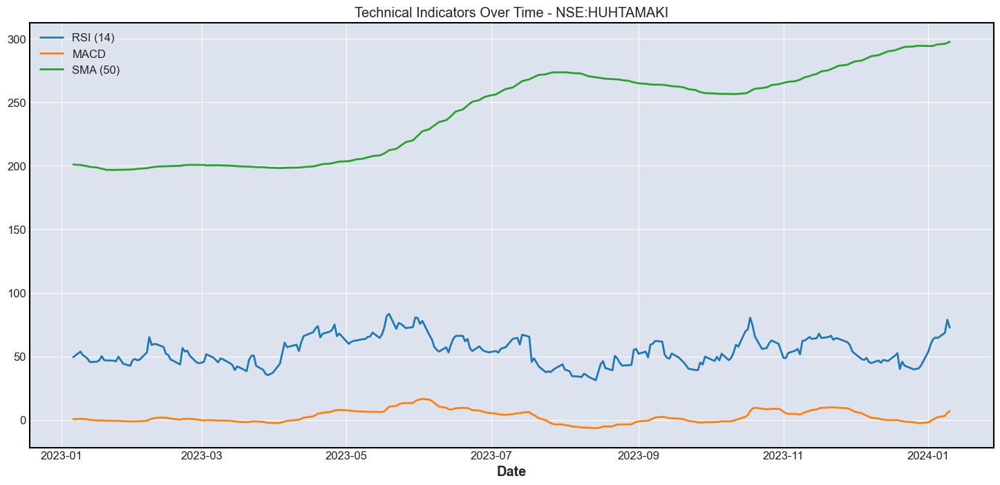

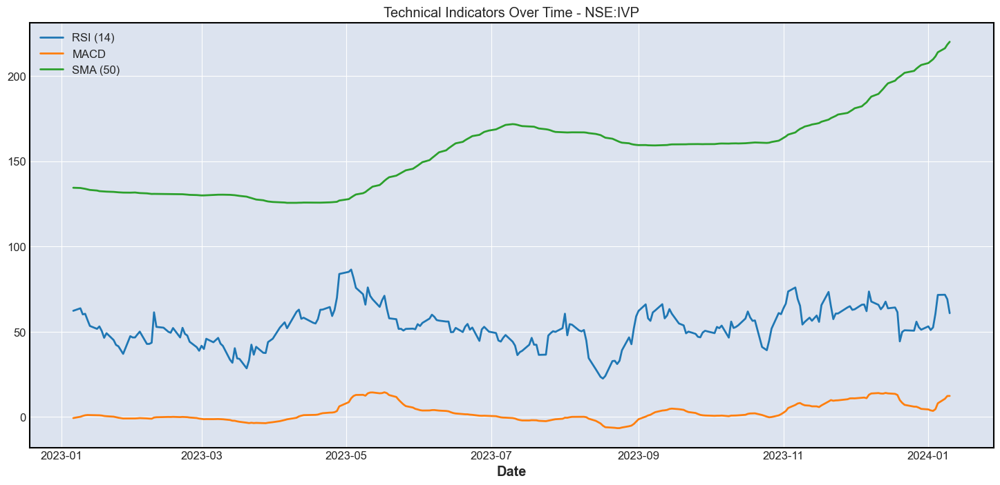

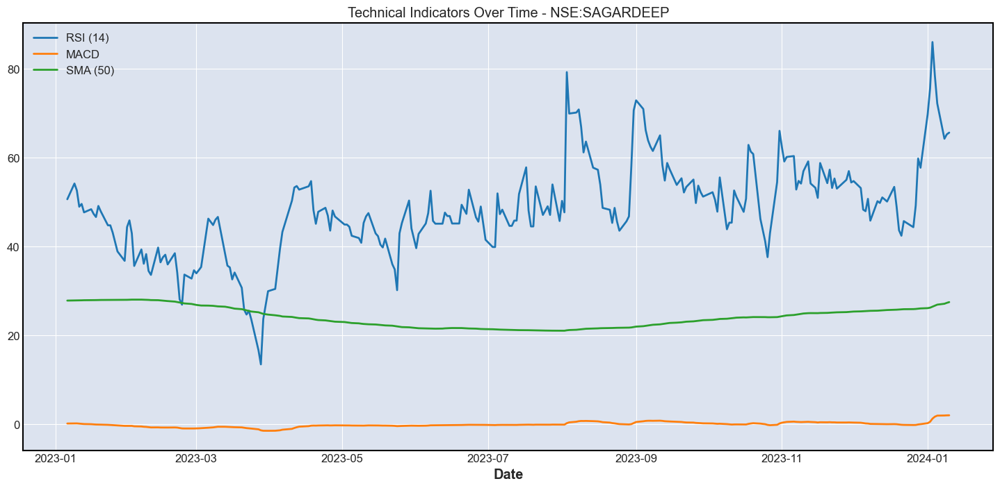

In [45]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    plt.figure(figsize=(18, 8))
    plt.plot(symbol_data['datetime'], symbol_data['rsi_14'], label='RSI (14)')
    plt.plot(symbol_data['datetime'], symbol_data['macd'], label='MACD')
    plt.plot(symbol_data['datetime'], symbol_data['sma_50'], label='SMA (50)')
    plt.title(f'Technical Indicators Over Time - {symbol}')
    plt.xlabel('Date')
    plt.legend()
    plt.show()

In [46]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    fig = go.Figure(data=[go.Candlestick(x=symbol_data['datetime'],
                    open=symbol_data['open'],
                    high=symbol_data['high'],
                    low=symbol_data['low'],
                    close=symbol_data['close'])])

    fig.update_layout(title=f'Candlestick Chart - {symbol}', xaxis_title='Date', yaxis_title='Price')
    fig.show()

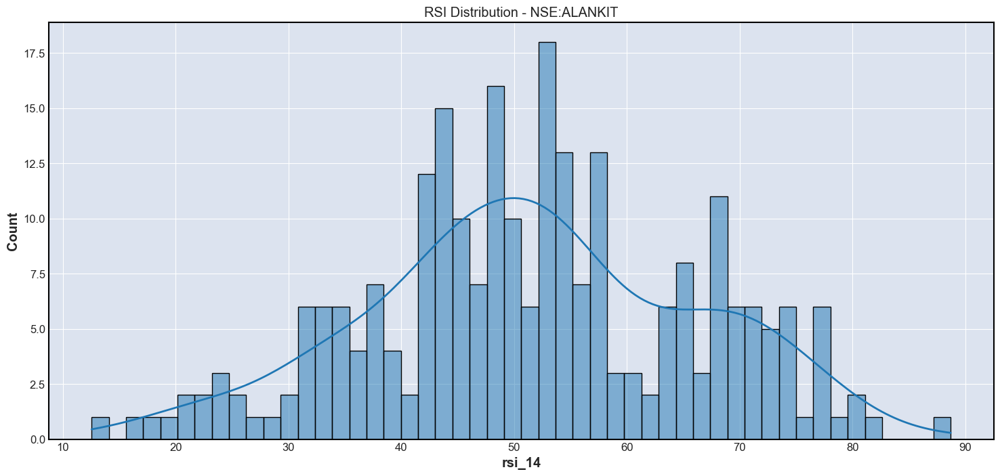

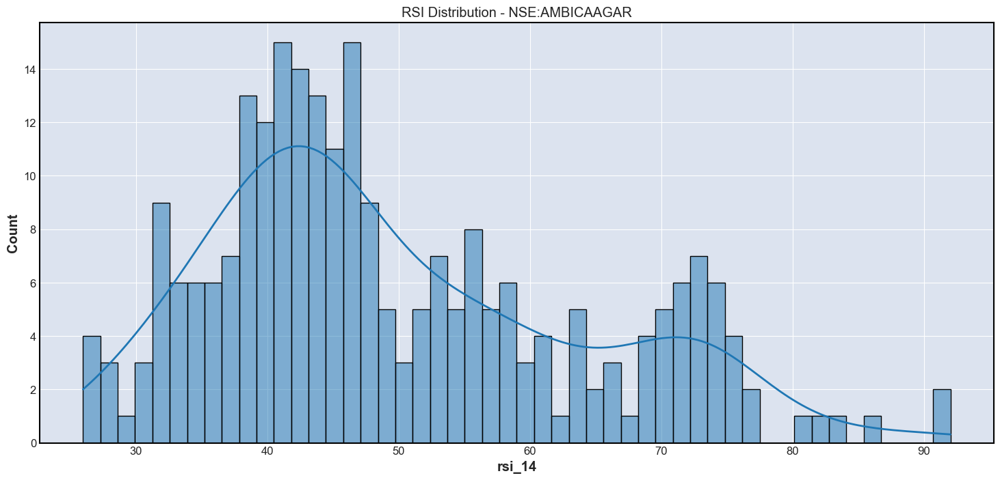

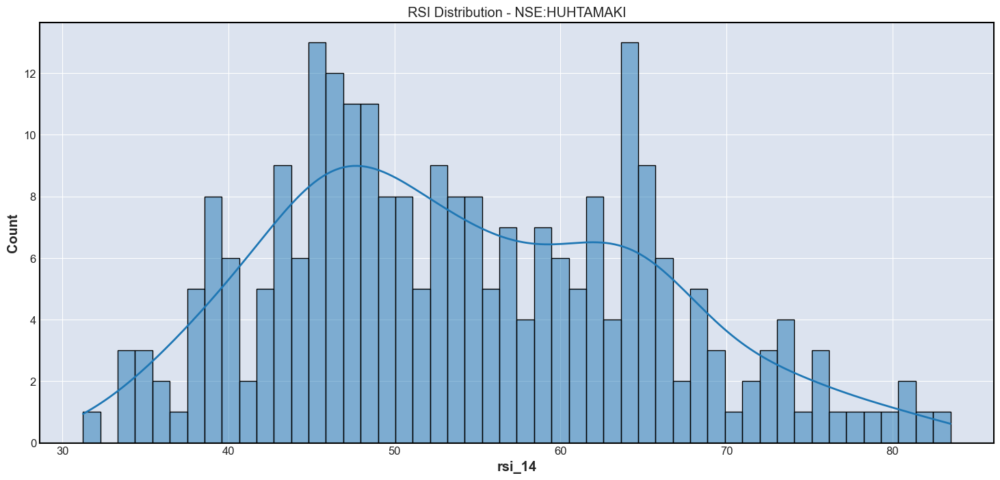

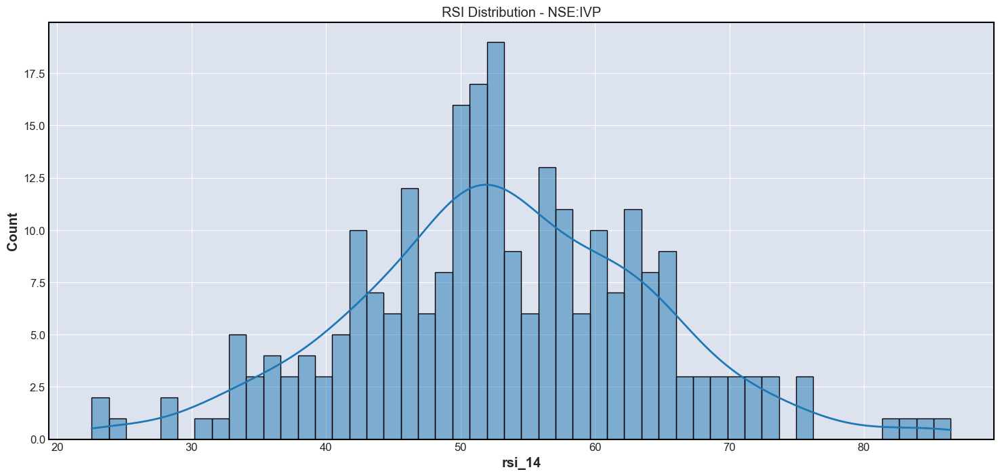

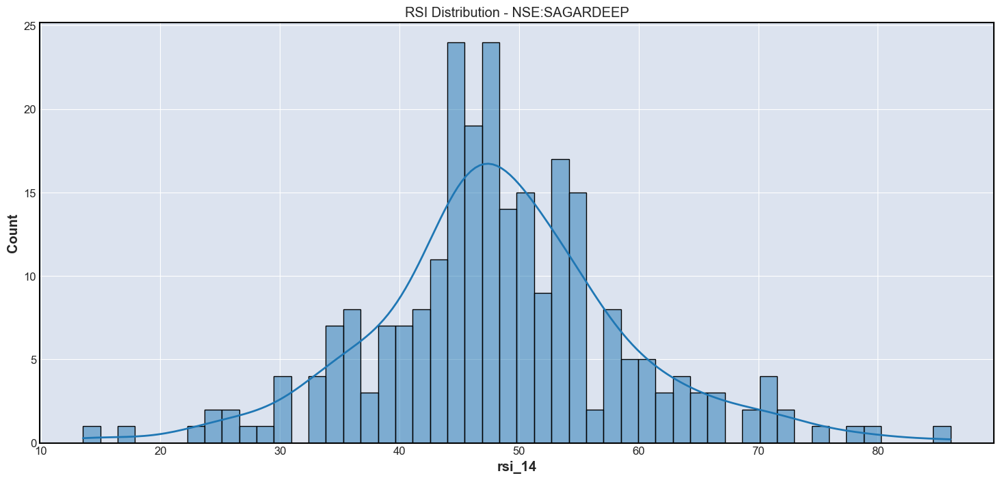

In [47]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    plt.figure(figsize=(18, 8))
    sns.histplot(symbol_data['rsi_14'], bins=50, kde=True)
    plt.title(f'RSI Distribution - {symbol}')
    plt.show()

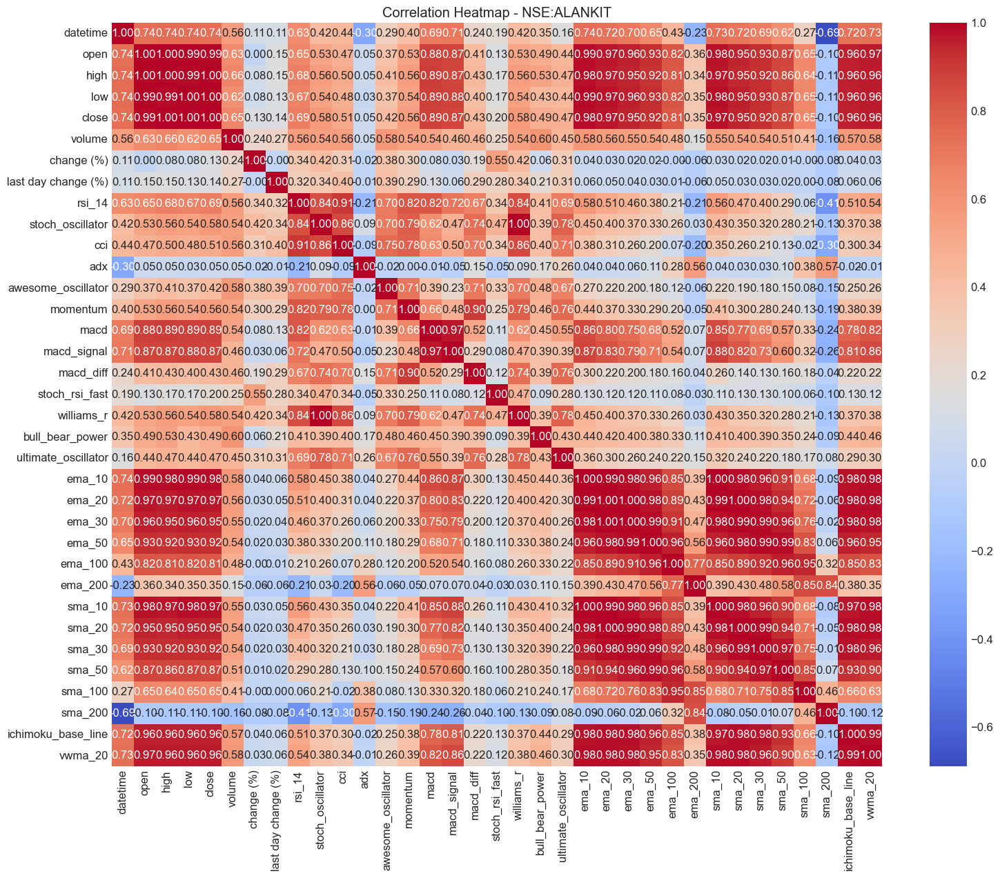

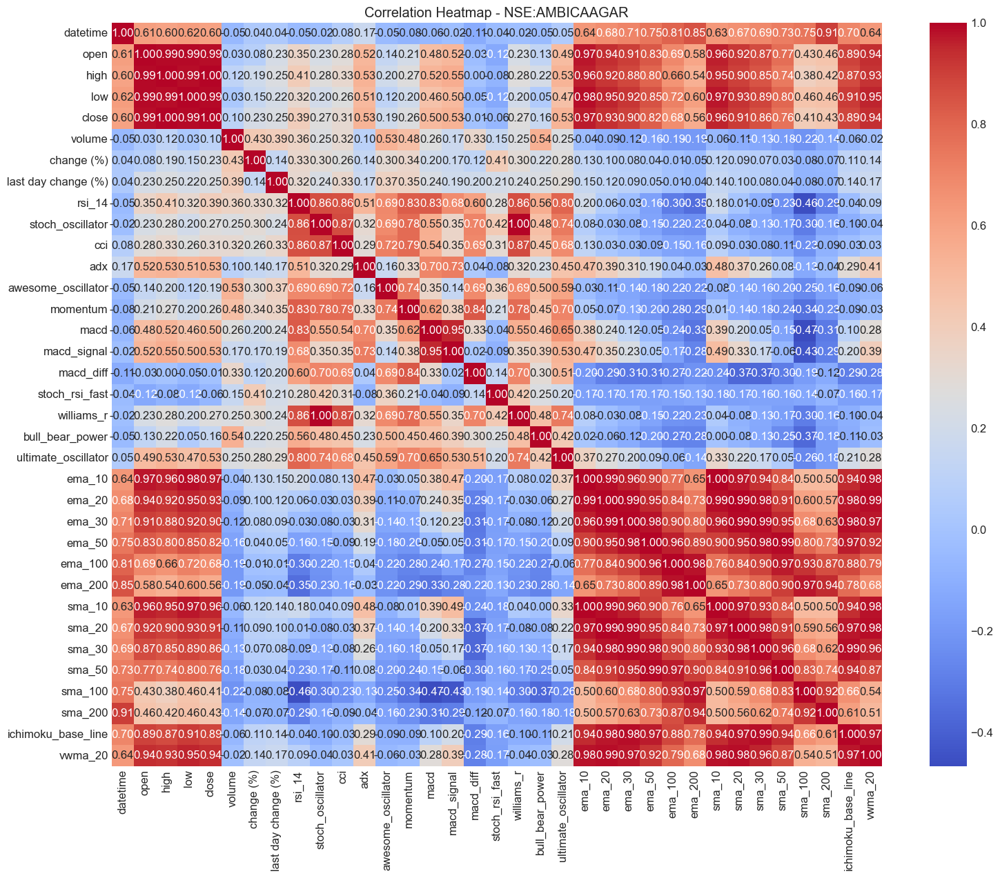

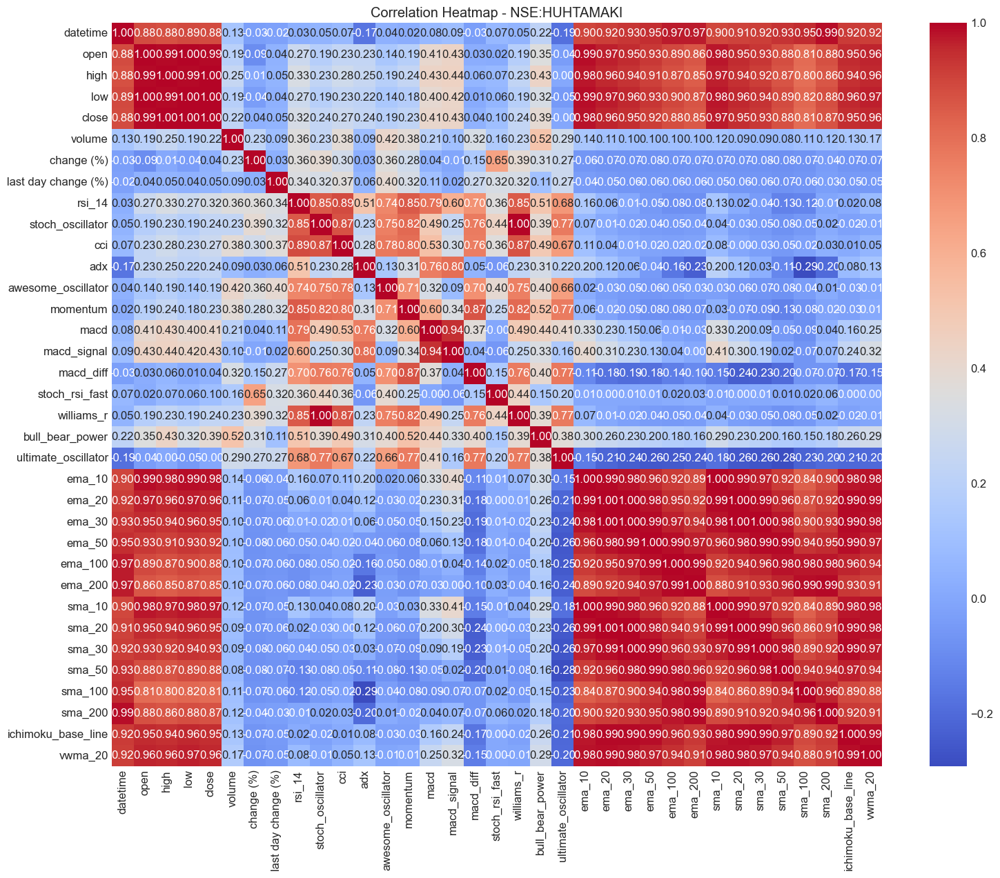

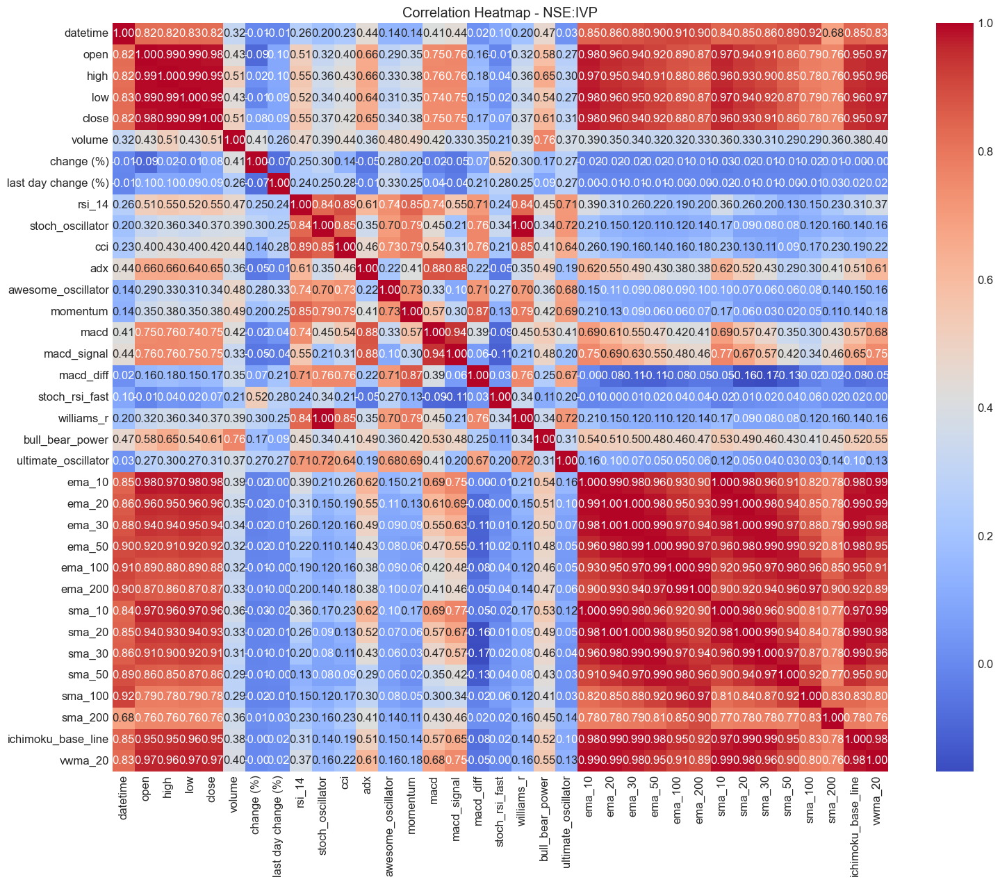

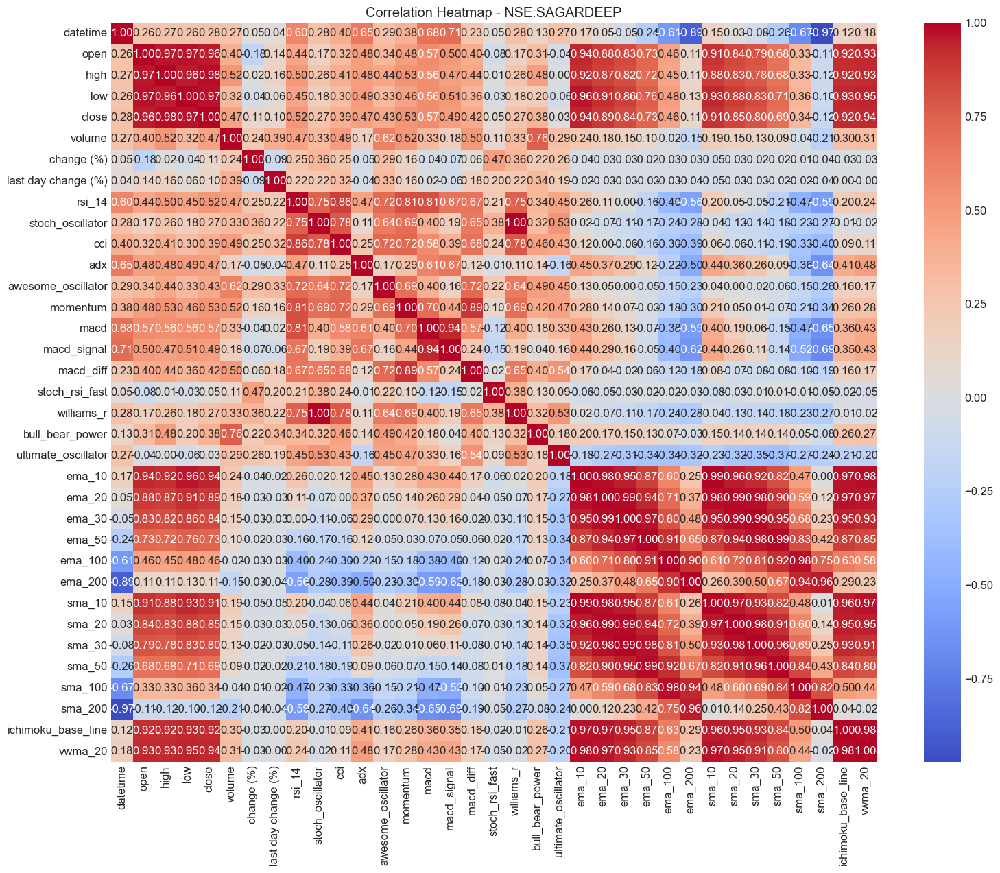

In [48]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    plt.figure(figsize=(18, 14))
    sns.heatmap(symbol_data.drop(['symbol'], axis=1).corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Heatmap - {symbol}')
    plt.show()

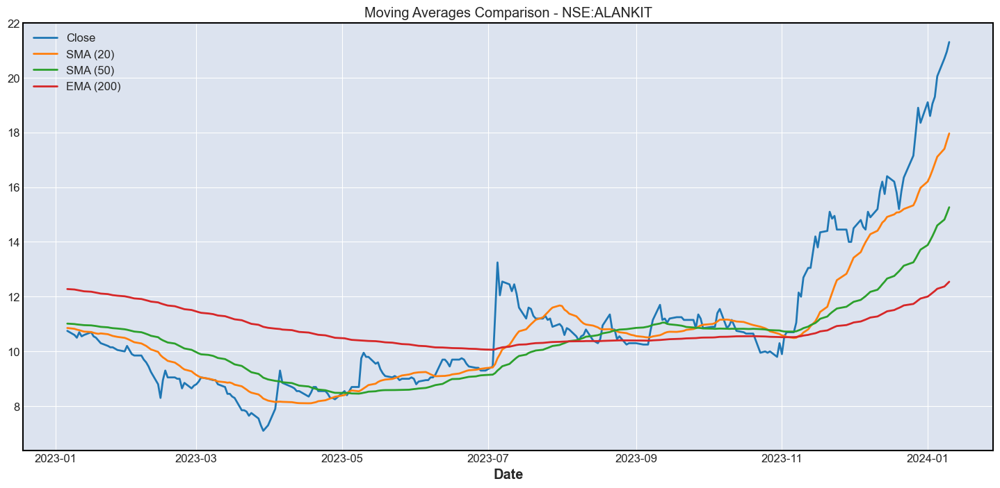

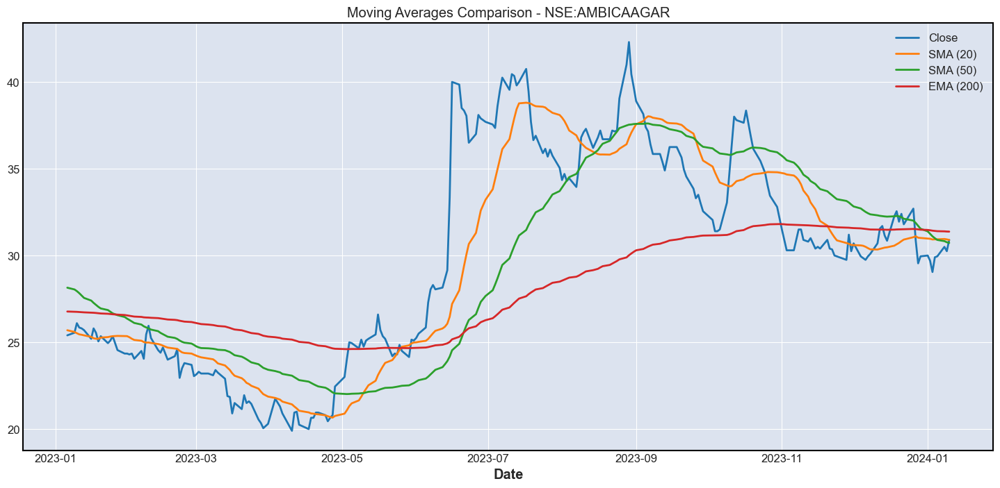

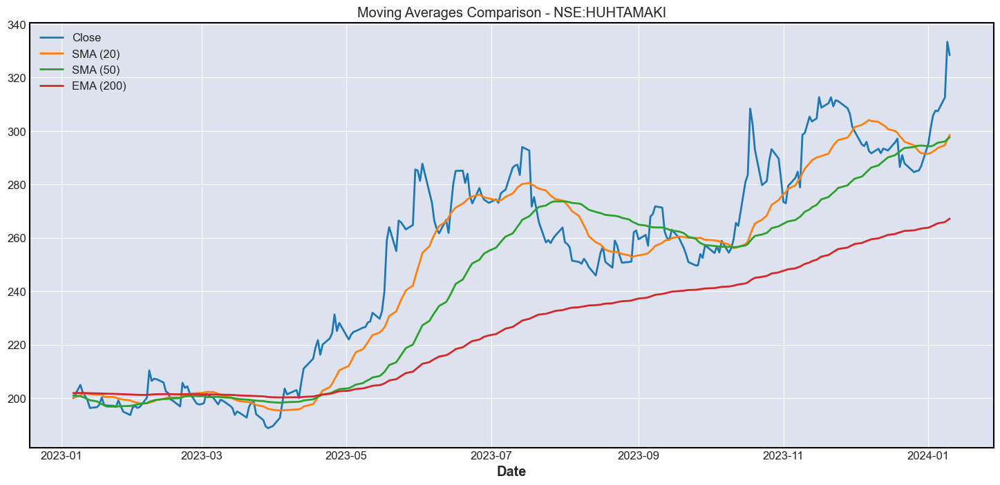

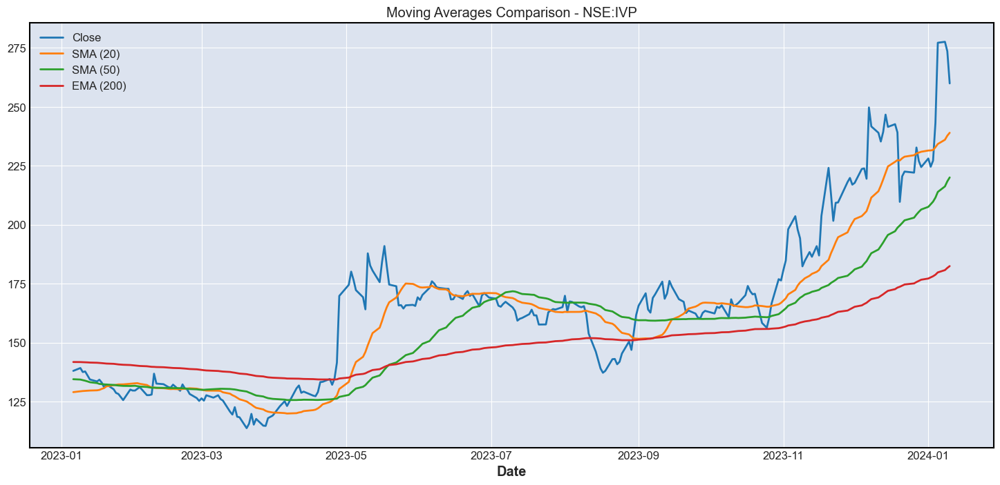

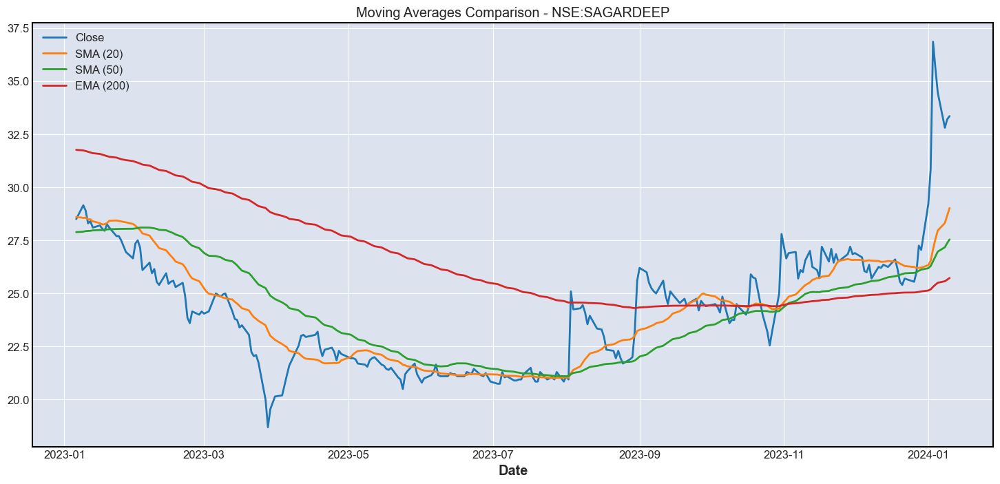

In [49]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    plt.figure(figsize=(18, 8))
    plt.plot(symbol_data['datetime'], symbol_data['close'], label='Close')
    plt.plot(symbol_data['datetime'], symbol_data['sma_20'], label='SMA (20)')
    plt.plot(symbol_data['datetime'], symbol_data['sma_50'], label='SMA (50)')
    plt.plot(symbol_data['datetime'], symbol_data['ema_200'], label='EMA (200)')
    plt.title(f'Moving Averages Comparison - {symbol}')
    plt.xlabel('Date')
    plt.legend()
    plt.show()

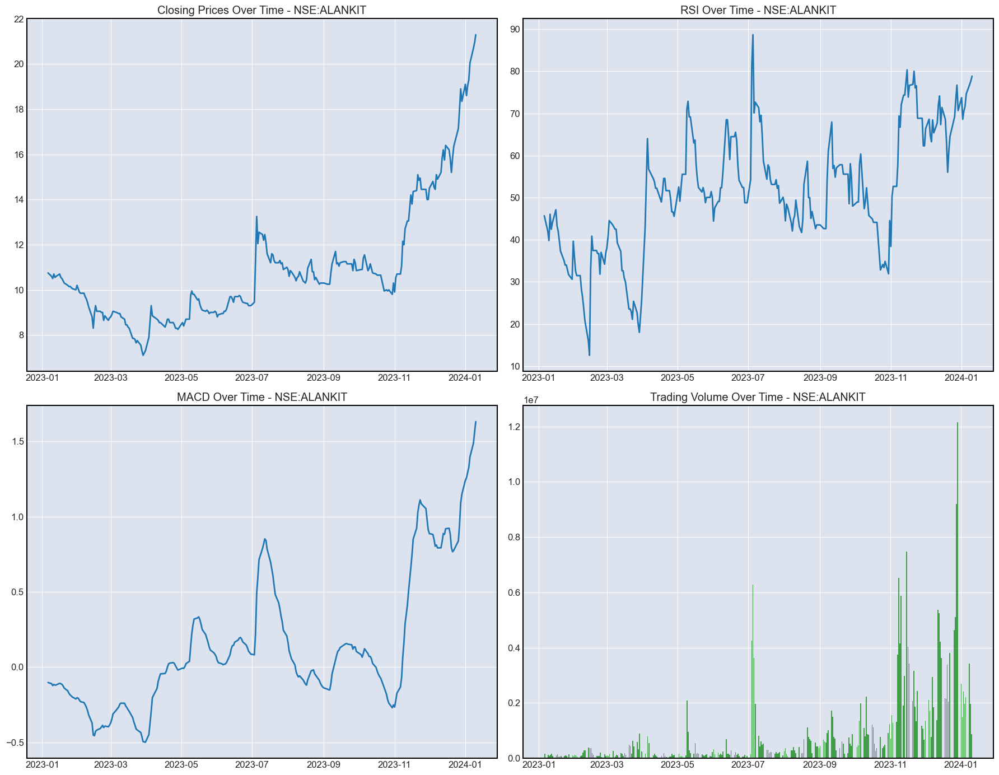

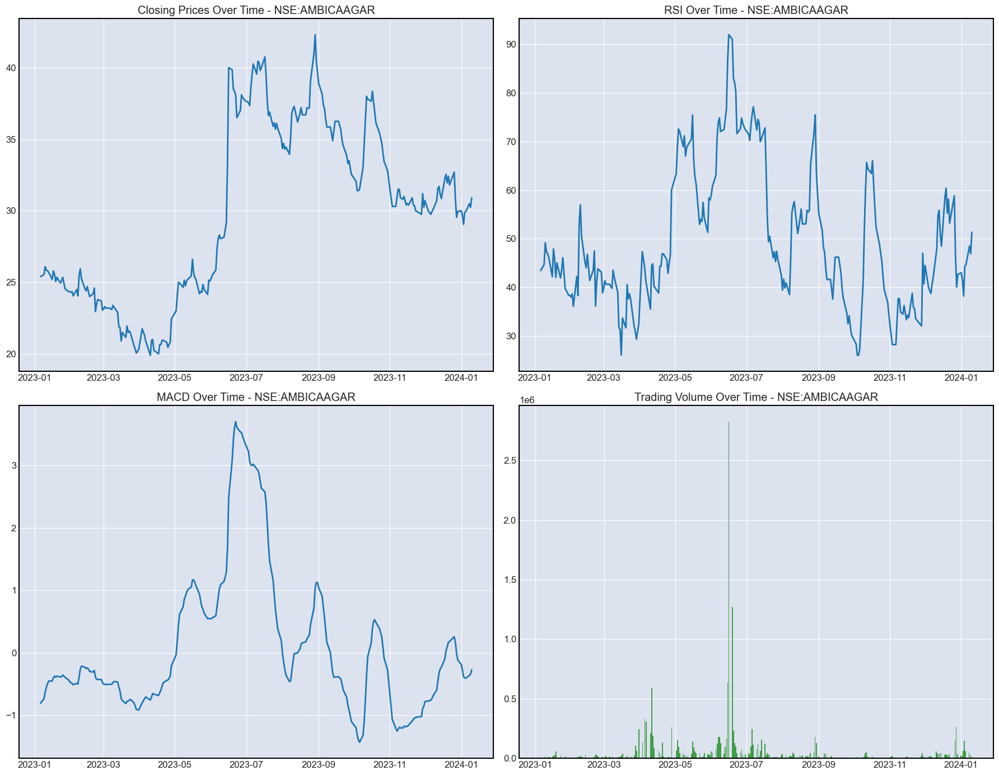

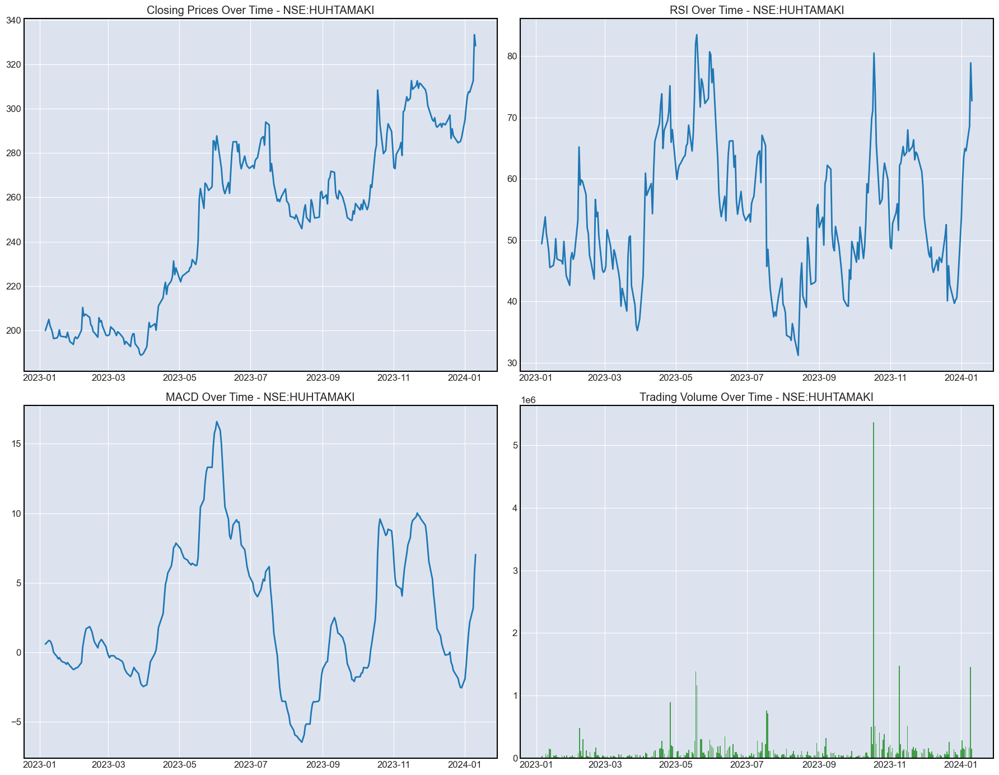

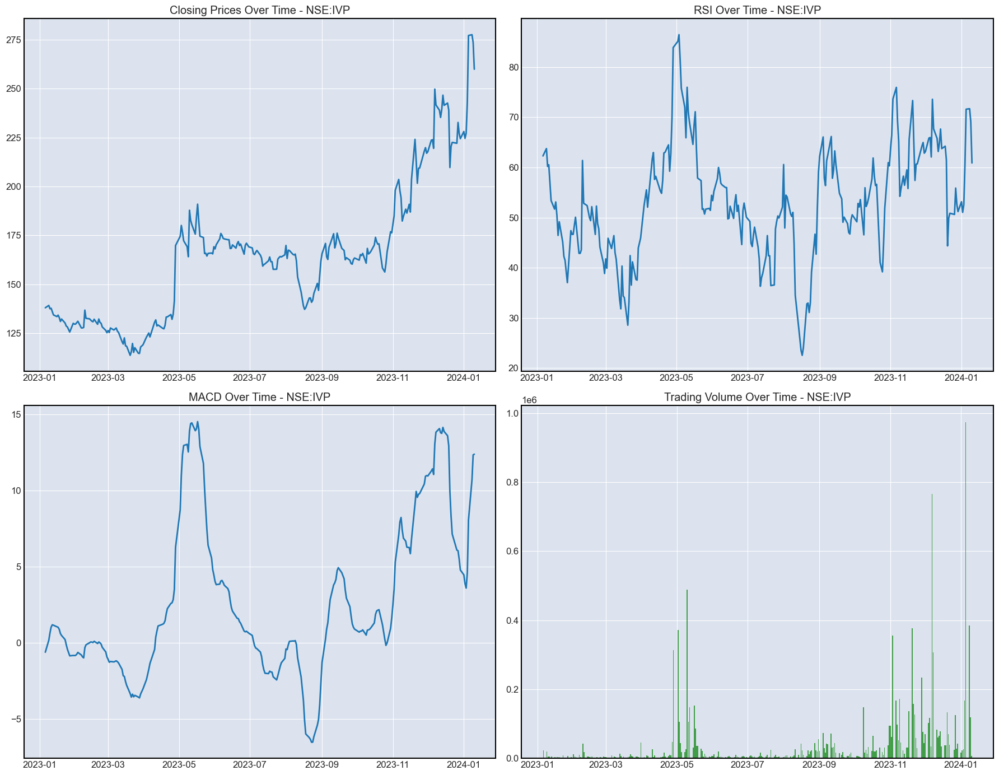

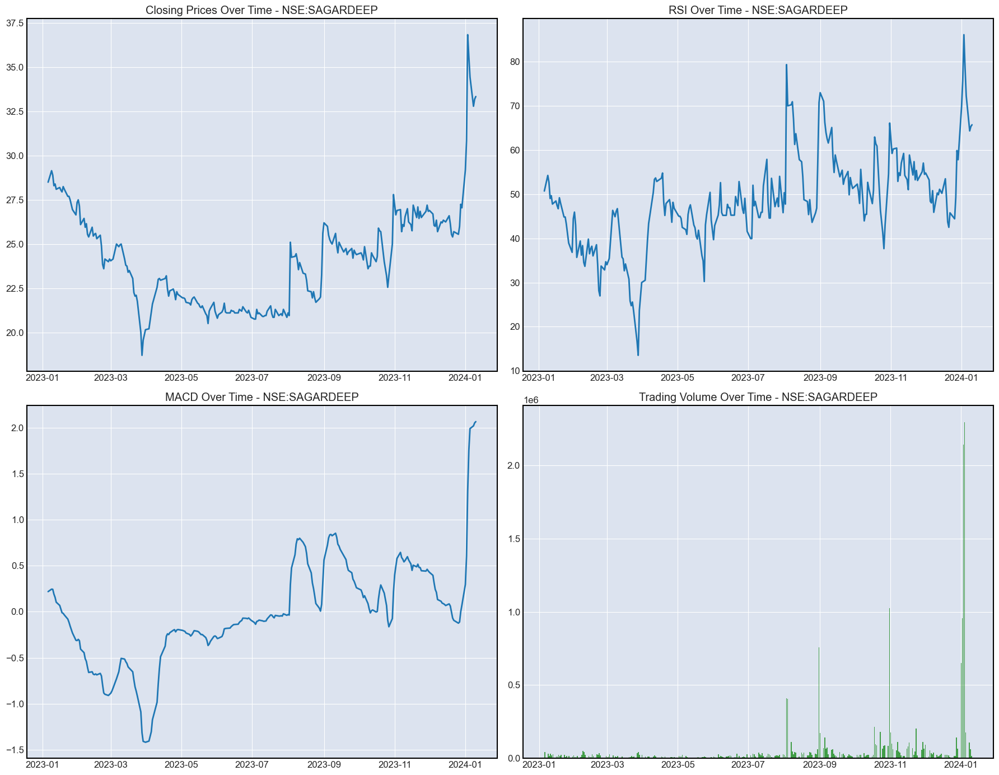

In [50]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 14))

    # Subplot 1: Closing Prices
    axes[0, 0].plot(symbol_data['datetime'], symbol_data['close'], label='Close')
    axes[0, 0].set_title(f'Closing Prices Over Time - {symbol}')

    # Subplot 2: RSI
    axes[0, 1].plot(symbol_data['datetime'], symbol_data['rsi_14'], label='RSI (14)')
    axes[0, 1].set_title(f'RSI Over Time - {symbol}')

    # Subplot 3: MACD
    axes[1, 0].plot(symbol_data['datetime'], symbol_data['macd'], label='MACD')
    axes[1, 0].set_title(f'MACD Over Time - {symbol}')

    # Subplot 4: Volume
    axes[1, 1].bar(symbol_data['datetime'], symbol_data['volume'], label='Volume', color='green', alpha=0.7)
    axes[1, 1].set_title(f'Trading Volume Over Time - {symbol}')

    plt.tight_layout()
    plt.show()

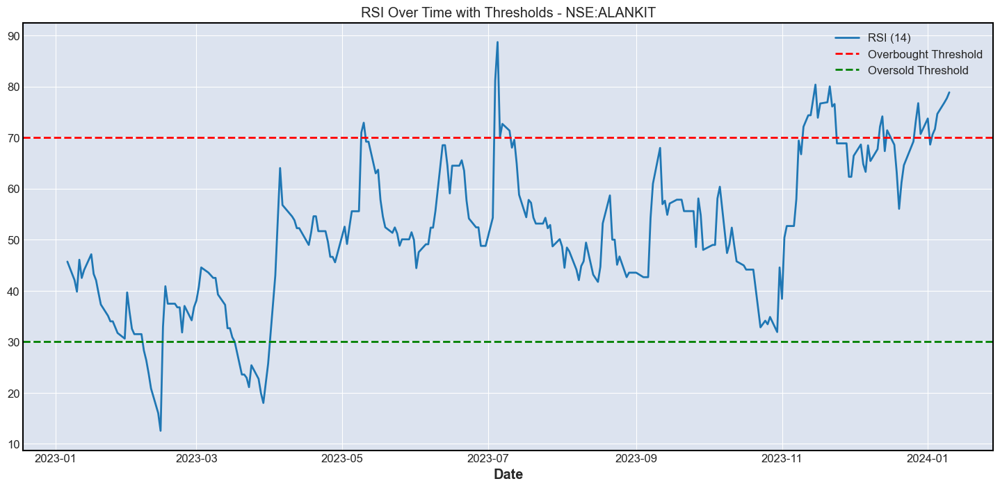

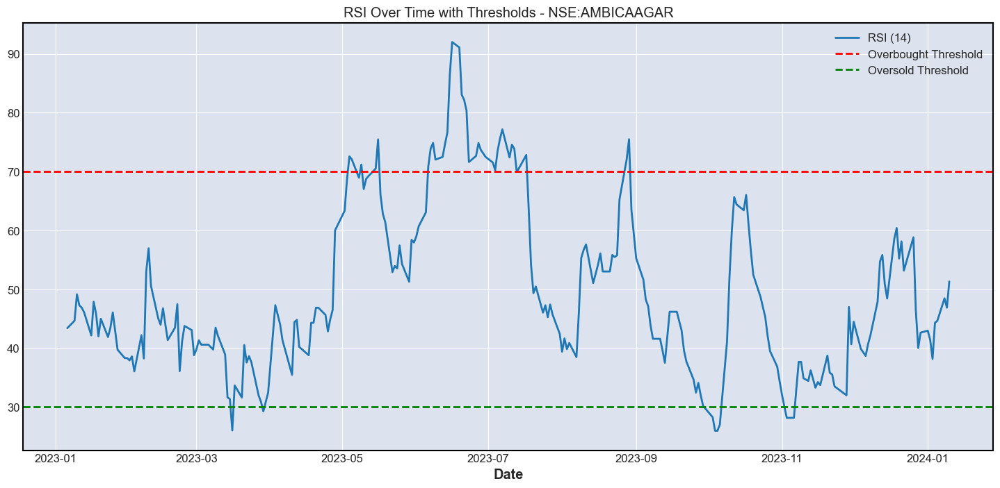

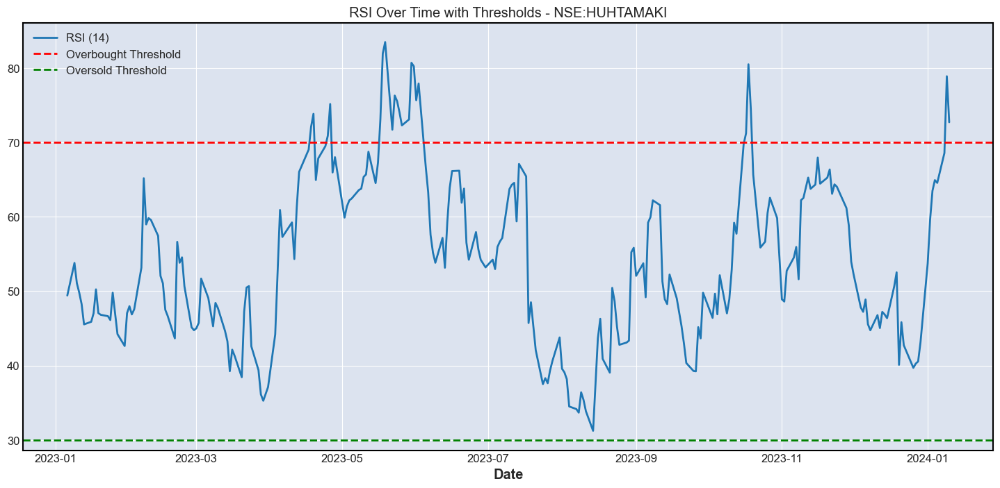

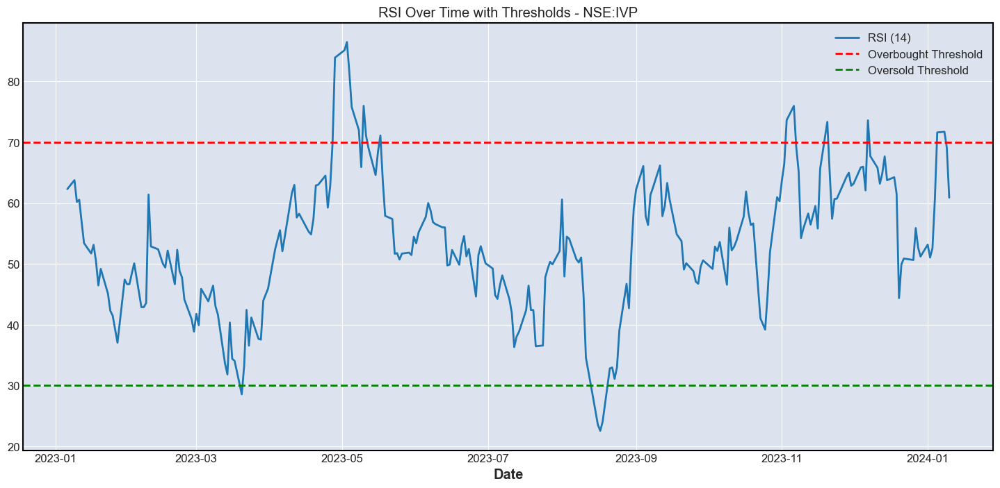

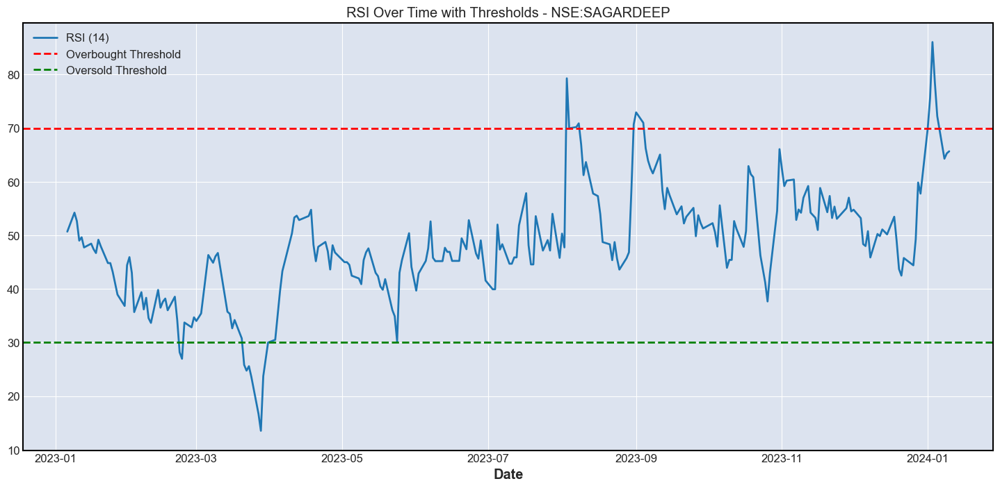

In [51]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    plt.figure(figsize=(18, 8))
    plt.plot(symbol_data['datetime'], symbol_data['rsi_14'], label='RSI (14)')
    plt.axhline(y=70, color='r', linestyle='--', label='Overbought Threshold')
    plt.axhline(y=30, color='g', linestyle='--', label='Oversold Threshold')
    plt.title(f'RSI Over Time with Thresholds - {symbol}')
    plt.xlabel('Date')
    plt.legend()
    plt.show()

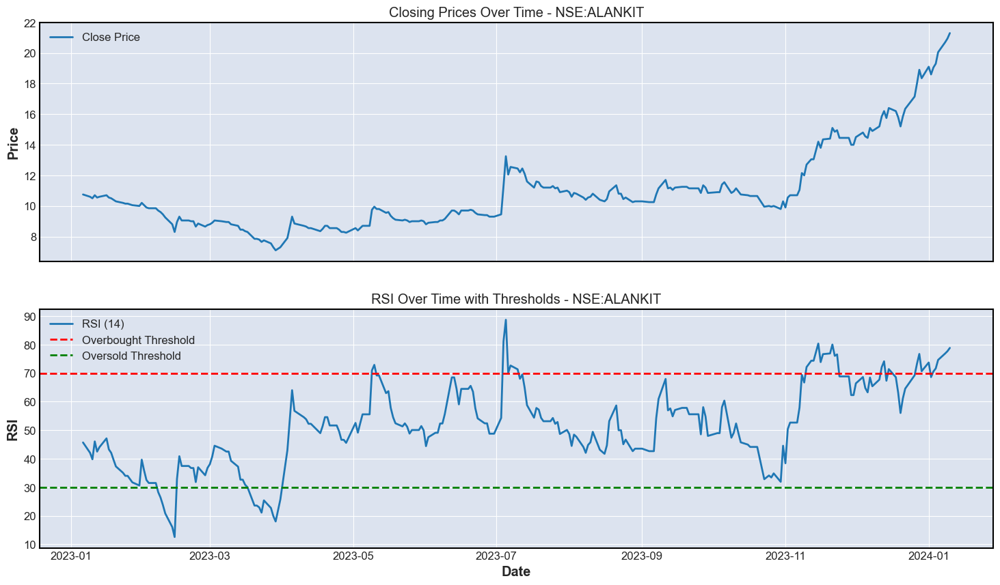

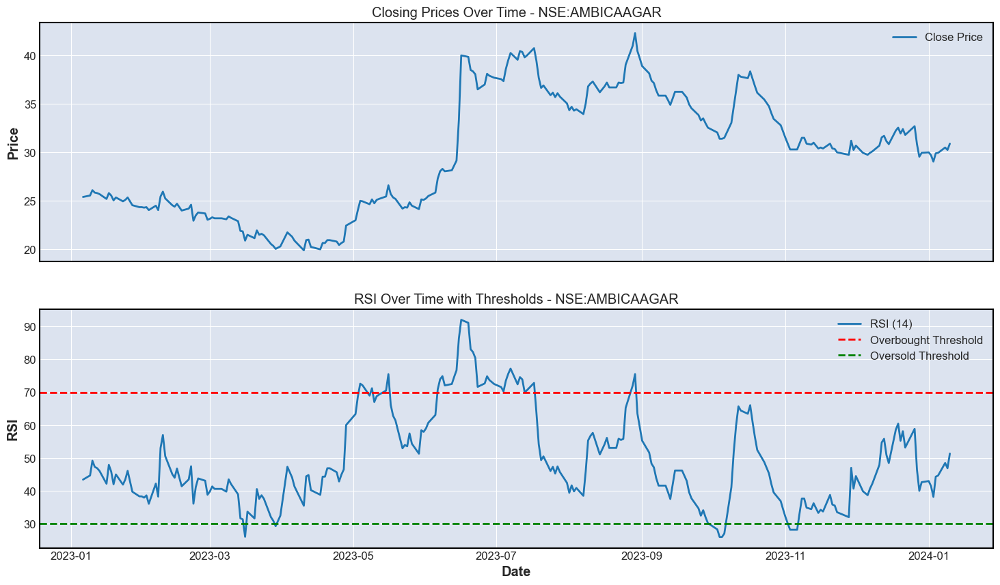

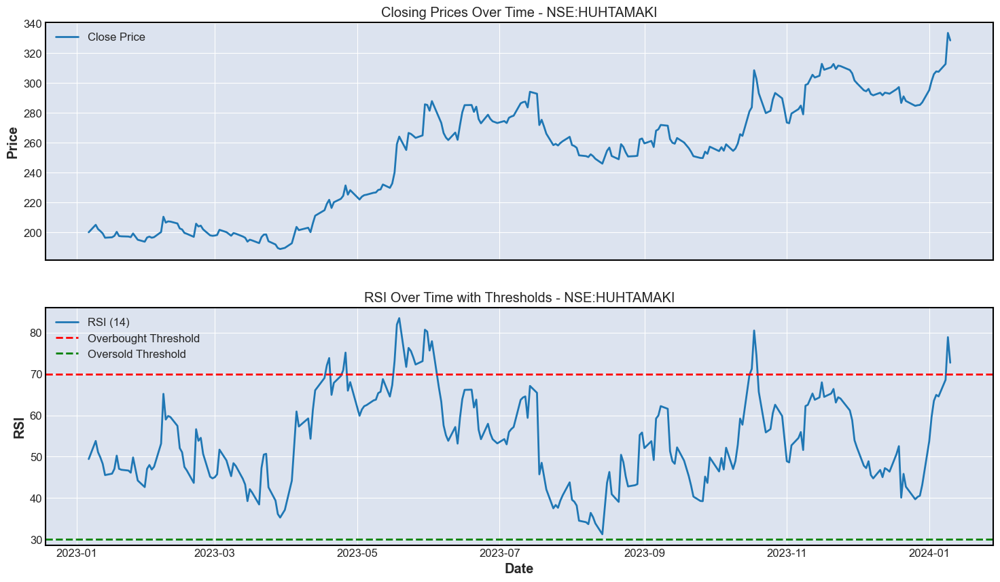

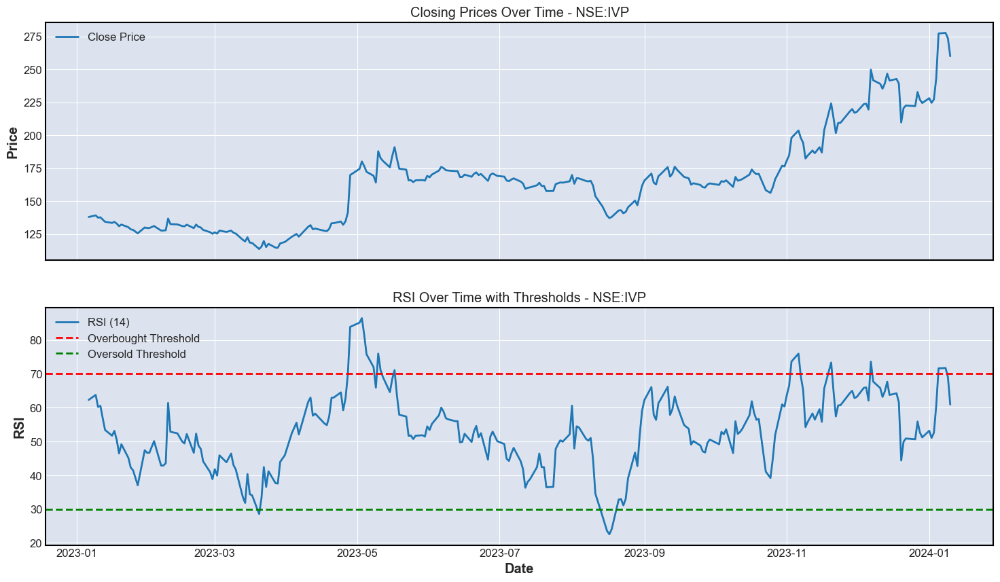

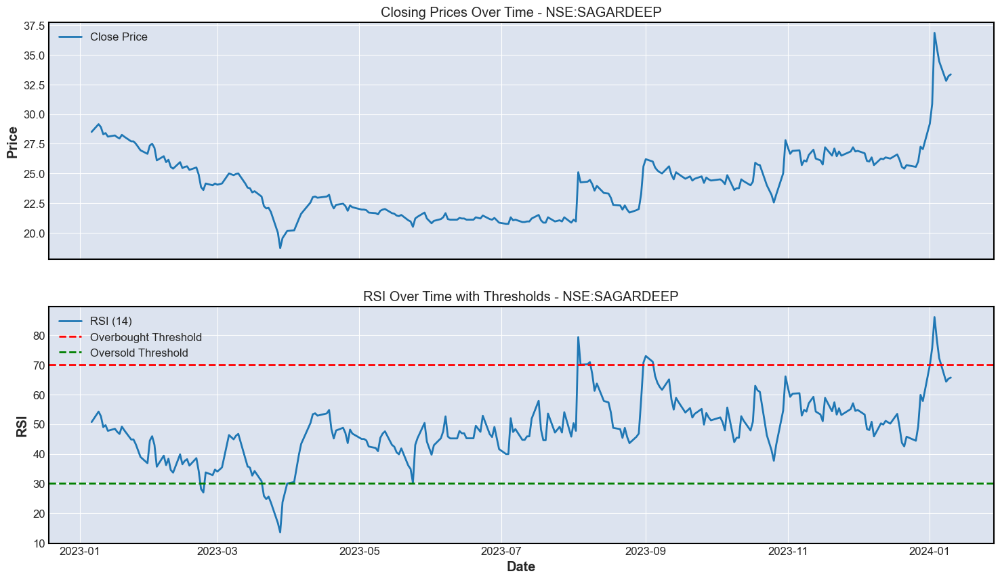

In [52]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    fig, axes = plt.subplots(nrows=2, figsize=(18, 10), sharex=True)
    axes[0].plot(symbol_data['datetime'], symbol_data['close'], label='Close Price')
    axes[1].plot(symbol_data['datetime'], symbol_data['rsi_14'], label='RSI (14)')
    axes[1].axhline(y=70, color='r', linestyle='--', label='Overbought Threshold')
    axes[1].axhline(y=30, color='g', linestyle='--', label='Oversold Threshold')
    axes[0].set_title(f'Closing Prices Over Time - {symbol}')
    axes[1].set_title(f'RSI Over Time with Thresholds - {symbol}')
    axes[1].set_xlabel('Date')
    axes[0].set_ylabel('Price')
    axes[1].set_ylabel('RSI')
    axes[0].legend()
    axes[1].legend()
    plt.show()

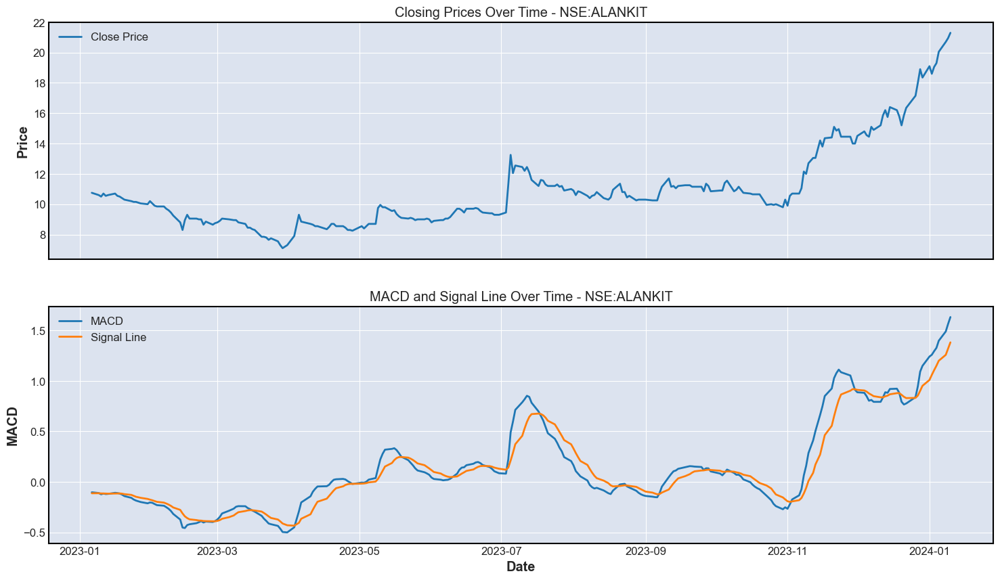

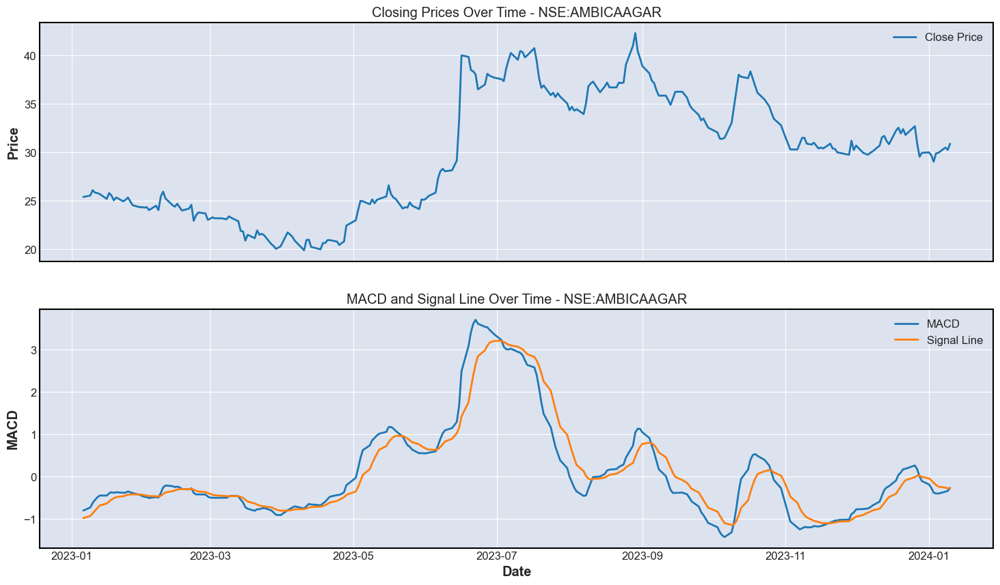

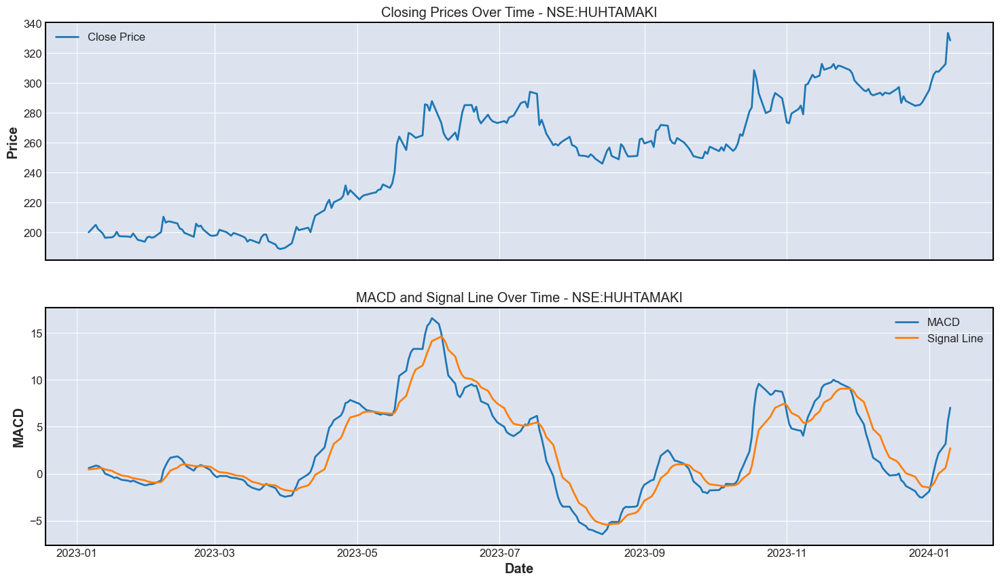

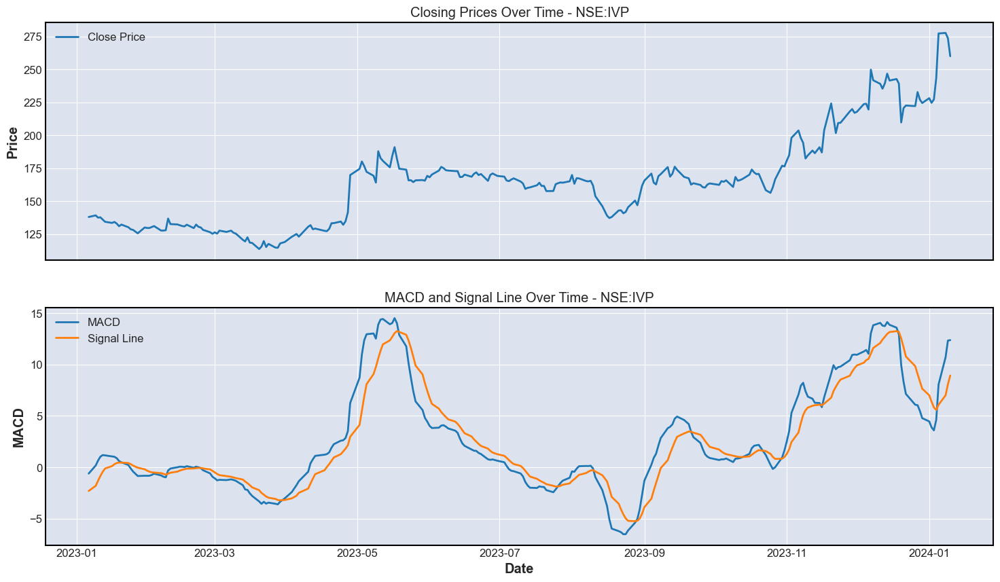

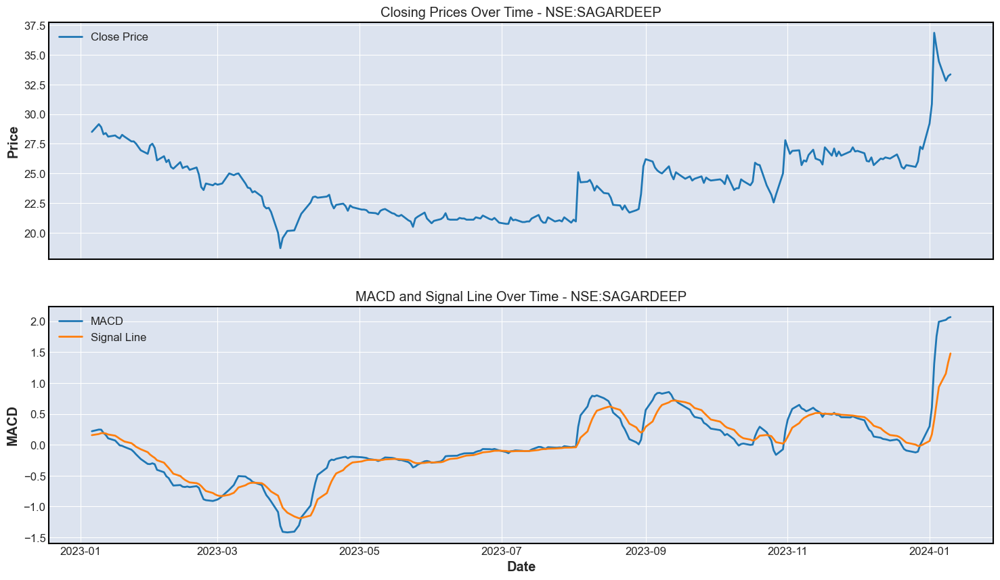

In [53]:
for symbol, symbol_data in filtered_data.groupby('symbol'):
    fig, axes = plt.subplots(nrows=2, figsize=(18, 10), sharex=True)
    axes[0].plot(symbol_data['datetime'], symbol_data['close'], label='Close Price')
    axes[1].plot(symbol_data['datetime'], symbol_data['macd'], label='MACD')
    axes[1].plot(symbol_data['datetime'], symbol_data['macd_signal'], label='Signal Line')
    axes[0].set_title(f'Closing Prices Over Time - {symbol}')
    axes[1].set_title(f'MACD and Signal Line Over Time - {symbol}')
    axes[1].set_xlabel('Date')
    axes[0].set_ylabel('Price')
    axes[1].set_ylabel('MACD')
    axes[0].legend()
    axes[1].legend()
    plt.show()